In [20]:
##<script>
##  jQuery(document).ready(function($) {  
##  
##  $(window).on('load', function(){
##    $('#preloader').fadeOut('slow',function(){$(this).remove();});
##  });
##  
##  });
##</script>
##
##<style type="text/css">
##  div#preloader { position: fixed; 
##      left: 0; 
##      top: 0; 
##      z-index: 999; 
##      width: 100%; 
##      height: 100%; 
##      overflow: visible; 
##      background: #fff url('http://preloaders.net/preloaders/720/Moving%20line.gif') no-repeat center center; 
##  }
##
##</style>
##
##<div id="preloader">
##
##</div>

# Auditory Perceptual Framing Analysis Script (2021). Pitch discrimination task.

# Contents

# Data Analysis
## [0. Load Data](#load)
## [1. Correlation Graphs](#corr)
## [2. Logistic Plots](#log)
### [2.1. Logistic plots value](#logisticVal)
### [2.2. Logisitc plots familiarity](#logisticFam)
## [3. Regression Analysis](#reg)
### [3.1. Regressions per Condition](#regCond)
### [3.2. Regression per Participant](#regPart)
### [3.3. Regression including Familiarity](#regressionsFam)
#### [3.3.1 Choice](#ChoiceregressionFam)
#### [3.3.2 Confidence](#ConfregressionFam)
#### [3.3.3. Value + Familiarity](#VplusFregressionFam)
#### [3.3.4. Choice factors depending on familiarity](#ChoicFactregressionFam)
#### [3.3.5 BdM Familiarity-Value requested](#RequestregressionFam)
### [3.4. Hierarchical Regression (Pending)]()
# Appendix
## [1. Importing packages](#ImpPkg)
## [2. Loading Functions](#LoadFunc)




<a id='load'></a>
# 0. Load data and excluding participants

In [19]:
# Load data all participants
data_exp1 = pd.read_csv('/Users/pradyumna/Documents/GiTs/PF2019/Data/DataPerceptualFramingNotebook_v1.csv') 
/Users/pradyumna/Google Drive/BdM Projects/pupilPEB2021/Pilots/pilot data/pilot1
for i in [31]:
    data_exp1 = data_exp1[(data_exp1.Part != i)]
print (data_exp1["Part"].unique())
print ('Number of participants: ' + str(len(data_exp1["Part"].unique())))

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 32 33]
Number of participants: 32


In [20]:
data_exp1=data_exp1.rename(index=str, columns={"ChosenITM":"Choice", 
                              "ChoiceRT":"RT",
                             "RValue":"RVal",
                             "LValue":"LVal",
                             "zRValue":"zRVal",
                             "zLValue":"zLVal",                    
                             "tDDT":"DDT",
                             "absDDT":"zAbsDDT",
                             "lIA_DT":"LDwellTime",
                             "rIA_DT":"RDwellTime",
                             "tGSF":"GSF",
                             "lastFixat":"LastFixat",
                             "DV":"DVal",
                             "zDV":"zDVal",
                             "absDV":"AbsDVal",
                             "zAbsDV":"zAbsDVal",                    
                             "zChoiceRT":"zRT",
                             "FamCh":"ChosenFam",
                              "FamUnCh":"UnchosenFam",
                              "ValCh":"ChosenVal",
                              "ValUnCh":"UnchosenVal",
                             "zFamCh":"zChosenFam",
                              "zFamUnCh":"zUnchosenFam",
                              "zValCh":"zChosenVal",
                              "zValUnCh":"zUnchosenVal",                   
                              "GSFMedSplit":"GSFSplit",
                            "DDTMedSplit":"DDTSplit"})
data_exp1.head()

,Unnamed: 0,Part,TrialN,PairID,LVal,RVal,Choice,RT,Conf,ConfRT,...,zDDT,zAbsDDT,zValR,zValL,ConfSplit,GSFSplit,DDTSplit,BaseCode,High,Low
0,0,1,1,49,110,131,0,4261.735,74,1584.966,...,-0.061319,0.061319,1.989851,1.170501,1,1,1,2,1.989851,1.170501
1,1,1,2,13,47,50,1,3559.258,54,1864.387,...,-0.056457,0.056457,-1.170501,-1.287551,0,1,1,0,-1.287551,-1.170501
2,2,1,3,16,50,44,1,3754.464,64,3778.807,...,0.497880,0.497880,-1.404601,-1.170501,0,0,1,0,-1.170501,-1.404601
3,3,1,4,7,57,50,0,2431.751,84,3064.179,...,-2.436702,2.436702,-1.170501,-0.897384,1,0,0,0,-0.897384,-1.170501
4,4,1,5,18,42,50,0,2199.342,44,2850.845,...,-0.817455,0.817455,-1.170501,-1.482634,0,0,0,0,-1.482634,-1.170501


In [21]:
# Just to generate additional file with all the measures separated by condition
#data_expL = data_exp1.loc[data_exp1['BlockCond'] == 1] # 1 = Like, 2 = Dislike
#data_expD = data_exp1.loc[data_exp1['BlockCond'] == 2] 

#data_expL.to_csv("InputData/FFAllData_Like.csv",index = False)
#data_expD.to_csv("InputData/FFAllData_Dislike.csv",index = False)

# Data Analysis 
-------------------------------------------

### List of parameters available for analysis

In [22]:
figsize(15, 15)
#Transform to numeric values in the dataframe
data_exp1 = data_exp1.apply(pd.to_numeric, errors='ignore')
#data_exp1.head()
#Show the list of data columns
list(data_exp1)

['Unnamed: 0',
 'Part',
 'TrialN',
 'PairID',
 'LVal',
 'RVal',
 'Choice',
 'RT',
 'Conf',
 'ConfRT',
 'BlockCond',
 'DDT',
 'LDwellTime',
 'RDwellTime',
 'GSF',
 'LastFixat',
 'DVal',
 'zDVal',
 'AbsDVal',
 'zAbsDVal',
 'zConf',
 'zRT',
 'TotVal',
 'ChosenVal',
 'UnchosenVal',
 'Correct',
 'zTotVal',
 'zChosenVal',
 'zUnchosenVal',
 'zGSF',
 'zDDT',
 'zAbsDDT',
 'zValR',
 'zValL',
 'ConfSplit',
 'GSFSplit',
 'DDTSplit',
 'BaseCode',
 'High',
 'Low']

## Add missing zScored values

In [23]:
data_exp1["zGSF"] = z_score1(data_exp1,'Part',"GSF")
data_exp1["zDDT"] = z_score1(data_exp1,'Part',"DDT")
data_exp1["AbsDDT"] = abs(data_exp1["DDT"])
data_exp1["zAbsDDT"] = z_score1(data_exp1,'Part',"AbsDDT")

data_exp1["TotVal"] = data_exp1['LVal']+ data_exp1['RVal']
data_exp1["zTotVal"] = z_score1(data_exp1,'Part',"TotVal")

data_exp1["ChosenVal"] = data_exp1['RVal']*data_exp1['Choice']+ data_exp1['LVal']*(1-data_exp1['Choice'])
data_exp1["UnchosenVal"] = data_exp1['LVal']*data_exp1['Choice']+ data_exp1['RVal']*(1-data_exp1['Choice'])
data_exp1["zChosenVal"] = z_score1(data_exp1,'Part',"ChosenVal")
data_exp1["zUnchosenVal"] = z_score1(data_exp1,'Part',"UnchosenVal")


## Change the name of the BlockCond

In [24]:
# Change so everything is equal
data_exp1 = data_exp1.replace('NEXTLESS', 'MORE')
data_exp1 = data_exp1.replace('NEXTMORE', 'LESS')
data_exp1['BlockCond'].unique()

# Change so everything is equal
data_exp1 = data_exp1.replace('MORE', 1)
data_exp1 = data_exp1.replace('LESS', 2)
data_exp1['BlockCond'].unique()

array([2, 1])

## Add correct variable

In [25]:
Correct = []
for i in range(len(data_exp1)):
    if data_exp1.BlockCond[i] == 1:
        if (data_exp1.Choice[i] == 1 and (data_exp1.LVal[i] < data_exp1.RVal[i])) or (data_exp1.Choice[i] == 0 and (data_exp1.LVal[i] > data_exp1.RVal[i])):
            Correct.append(1)
        else:
            Correct.append(0)
    if data_exp1.BlockCond[i] == 2:
        if (data_exp1.Choice[i] == 1 and (data_exp1.LVal[i] > data_exp1.RVal[i])) or (data_exp1.Choice[i] == 0 and (data_exp1.LVal[i] < data_exp1.RVal[i])):
            Correct.append(1)
        else:
            Correct.append(0)

data_exp1["Correct"] = Correct

## Add Splits variable

In [26]:
data_splits = splitBy(data_exp1, Splits_headers = ['ConfSplit', 'GSFMedSplit','DDTMedSplit'],Splits_variables = ['Conf', 'GSF','DDT'])
#data_exp11 = splitBy(data_exp1.loc[data_exp1['Part'] == 1], ['ConfSplit'], ['Conf'])


In [27]:
data_exp1['ConfSplit'] = data_splits['ConfSplit'].values
data_exp1['GSFSplit'] = data_splits['GSFMedSplit'].values
data_exp1['DDTSplit'] = data_splits['DDTMedSplit'].values

## Add % time looked at each item

In [28]:
data_exp1['LGazePC'] = (data_exp1['LDwellTime']) / (data_exp1['RDwellTime'] + data_exp1['LDwellTime'])
data_exp1['RGazePC'] = (data_exp1['RDwellTime']) / (data_exp1['RDwellTime'] + data_exp1['LDwellTime'])

data_exp1['HValGazePC'] = ( data_exp1['LVal'] >= data_exp1['RVal'] ) * data_exp1['LGazePC'] + ( data_exp1['LVal'] <= data_exp1['RVal'] ) * data_exp1['RGazePC']
data_exp1['LValGazePC'] = ( data_exp1['LVal'] <= data_exp1['RVal'] ) * data_exp1['LGazePC'] + ( data_exp1['LVal'] >= data_exp1['RVal'] ) * data_exp1['RGazePC']

data_exp1['zLGazePC'] = z_score1(data_exp1,'Part','LGazePC')
data_exp1['zRGazePC'] = z_score1(data_exp1,'Part','RGazePC')

data_exp1['zHValGazePC'] = z_score1(data_exp1,'Part','HValGazePC')
data_exp1['zLValGazePC'] = z_score1(data_exp1,'Part','LValGazePC')  

## add % time looked at chosen items

In [29]:
data_exp1['ChosenGazePC'] = ( data_exp1['Choice'] == 0) * data_exp1['LGazePC'] + ( data_exp1['Choice'] == 1) * data_exp1['LGazePC']
data_exp1['UnchosenGazePC'] = ( data_exp1['Choice'] == 1) * data_exp1['LGazePC'] + ( data_exp1['Choice'] == 0)  * data_exp1['RGazePC']

data_exp1['zChosenGazePC'] = z_score1(data_exp1,'Part','ChosenGazePC')
data_exp1['zUnchosenGazePC'] = z_score1(data_exp1,'Part','UnchosenGazePC')  

In [30]:
data_exp1.Part.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 32, 33])

In [31]:
#participant_densities(data_expL,'zRT') # Distribution of value of items

In [32]:
data_exp1

,Unnamed: 0,Part,TrialN,PairID,LVal,RVal,Choice,RT,Conf,ConfRT,...,HValGazePC,LValGazePC,zLGazePC,zRGazePC,zHValGazePC,zLValGazePC,ChosenGazePC,UnchosenGazePC,zChosenGazePC,zUnchosenGazePC
0,0,1,1,49,110,131,0,4261.735,74,1584.966,...,0.440599,0.559401,-0.089598,0.089598,-0.505890,0.505890,0.559401,0.440599,-0.089598,0.178471
1,1,1,2,13,47,50,1,3559.258,54,1864.387,...,0.434917,0.565083,-0.050047,0.050047,-0.541534,0.541534,0.565083,0.565083,-0.050047,1.085872
2,2,1,3,16,50,44,1,3754.464,64,3778.807,...,0.507407,0.492593,-0.451559,0.451559,-0.086746,0.086746,0.507407,0.507407,-0.451559,0.665460
3,3,1,4,7,57,50,0,2431.751,84,3064.179,...,0.823097,0.176903,1.746147,-1.746147,1.893824,-1.893824,0.823097,0.176903,1.746147,-1.743687
4,4,1,5,18,42,50,0,2199.342,44,2850.845,...,0.244806,0.755194,1.273434,-1.273434,-1.734254,1.734254,0.755194,0.244806,1.273434,-1.248722
5,5,1,6,51,108,110,0,3269.922,44,3745.039,...,0.284308,0.715692,0.998435,-0.998435,-1.486425,1.486425,0.715692,0.284308,0.998435,-0.960779
6,6,1,7,31,78,80,0,6606.698,74,2425.516,...,0.398754,0.601246,0.201709,-0.201709,-0.768416,0.768416,0.601246,0.398754,0.201709,-0.126548
7,7,1,8,58,110,92,1,3642.146,74,3030.001,...,0.690563,0.309437,0.823495,-0.823495,1.062331,-1.062331,0.690563,0.690563,0.823495,2.000533
8,8,1,9,12,50,48,1,5213.480,54,2229.314,...,0.544970,0.455030,-0.190066,0.190066,0.148910,-0.148910,0.544970,0.544970,-0.190066,0.939261
9,9,1,10,54,110,101,1,5511.334,34,1727.761,...,0.420875,0.579125,-1.053960,1.053960,-0.629630,0.629630,0.420875,0.420875,-1.053960,0.034702


<a id='corr'></a>
#  1. Correlation Plots 

## (MORE + LESS ) conditions

### Insert the variables to calculate the correlation

In [33]:
#x_variable = 'zAbsDVal'
#x_varlabel = '|zΔVal|'
#y_variable = 'zConf'
#y_varlabel =  'Confidence'

x_variable = 'zAbsDVal'
x_varlabel = 'zAbsDVal'
y_variable = 'zRT'
y_varlabel =  'zRT'

Pearson's r = -0.071 p =  0.0


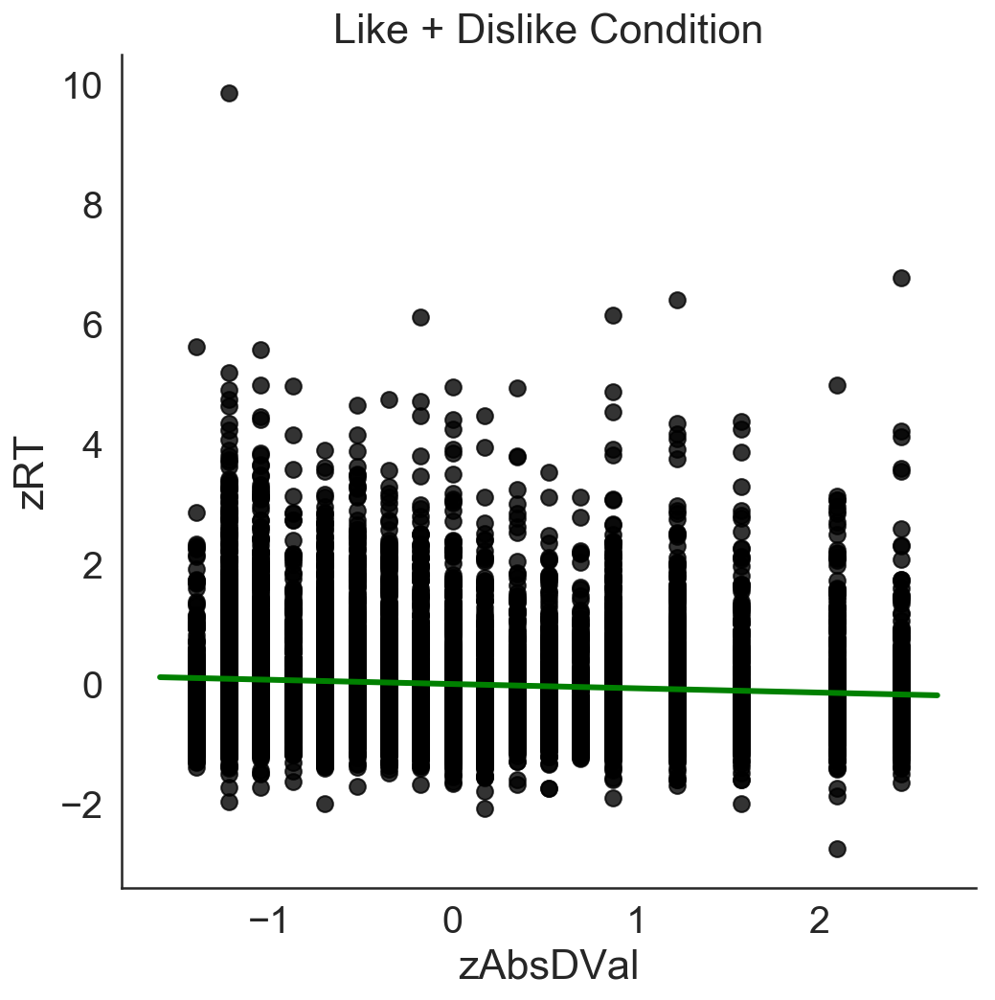

In [34]:
f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_exp1, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_exp1[x_variable]
y=data_exp1[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Green', lw=3)
sns.despine()
ax.set_title('Like + Dislike Condition')



results = pearsonr(data_exp1[x_variable], data_exp1[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Text(0.5, 1.0, 'Correlations Full Exp')

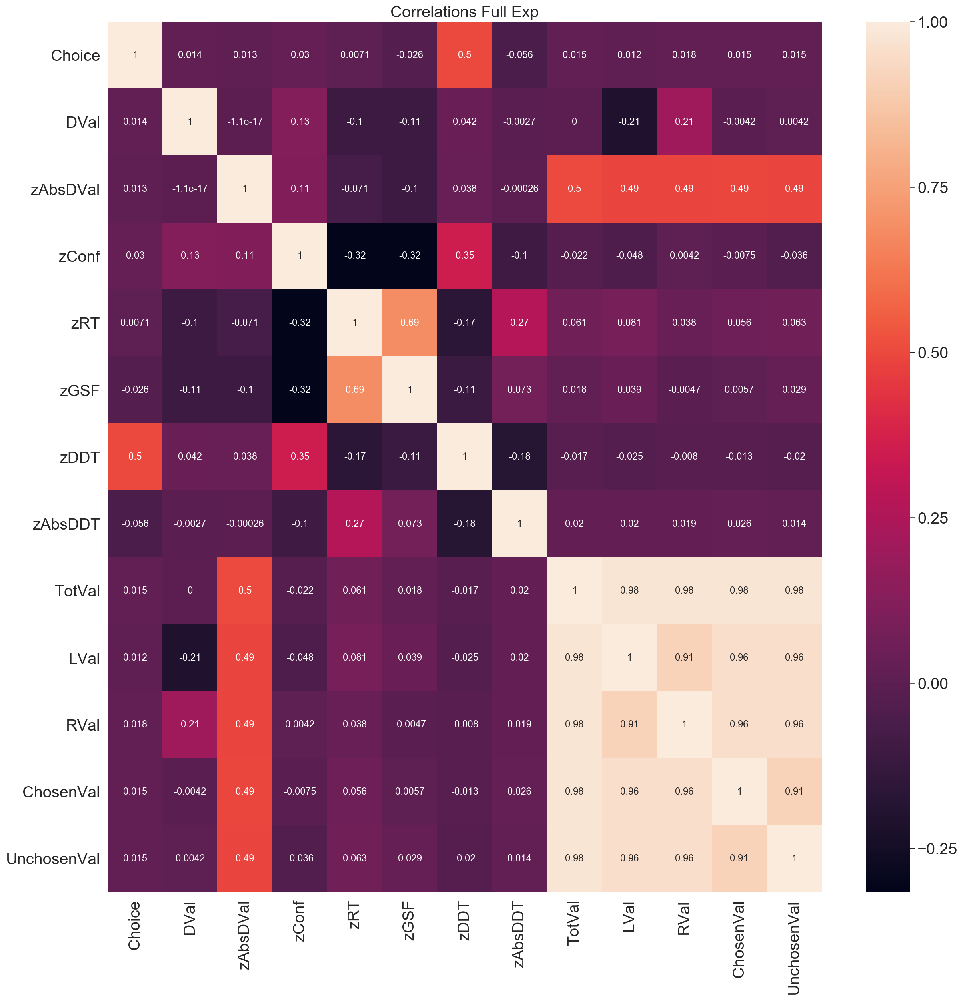

In [35]:
dataColsSelected = data_exp1.loc[:,  ['Choice','DVal','zAbsDVal','zConf','zRT', 'zGSF', 
                                     'zDDT', 'zAbsDDT', 'TotVal', 'LVal','RVal', 
                                     'ChosenVal', 'UnchosenVal']]
dataColsSelected
data_corr = dataColsSelected.corr(method='pearson')
data_corr
# plot the heatmap
fig, ax = plt.subplots(figsize=(20,20))         # Sample figsize in inches
sns.heatmap(data_corr, 
       xticklabels=data_corr.columns,
       yticklabels=data_corr.columns, annot=True, annot_kws={"size": 12})

ax.set_title('Correlations Full Exp',fontsize=20)
#sns.set(font_scale=0.8) 

## MORE Condition Only

In [36]:
#Select Condition 
data_expL = data_exp1.loc[data_exp1['BlockCond'] == 1] # 1 = MORE, 2 = LESS


### Insert the variables to calculate the correlation

In [37]:
x_variable = 'zAbsDVal'
x_varlabel = '|zΔV|'
y_variable = 'zRT'
y_varlabel =  'zRT'

Pearson's r = -0.09 p =  0.0


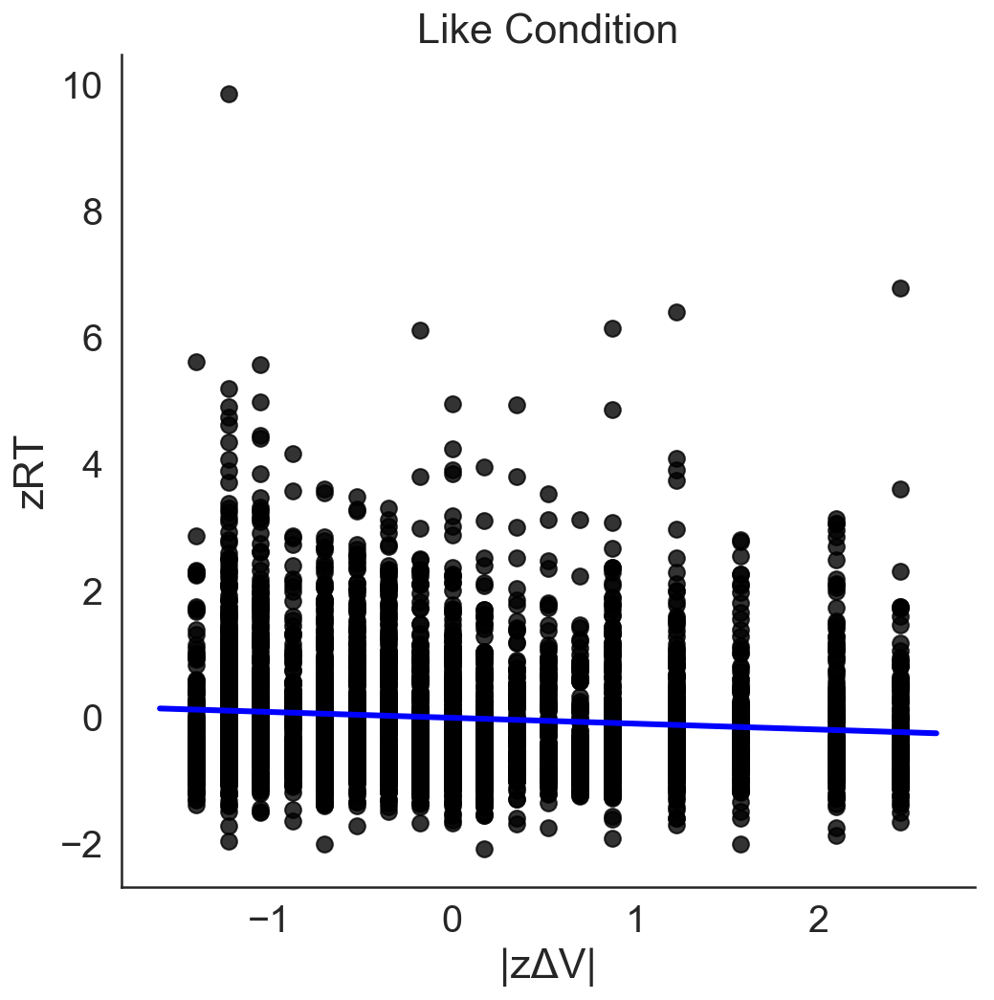

In [38]:
f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_expL, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_expL[x_variable]
y=data_expL[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Blue', lw=3)
sns.despine()
ax.set_title('Like Condition')



results = pearsonr(data_expL[x_variable], data_expL[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Text(0.5, 1.0, 'Correlations MORE Condition')

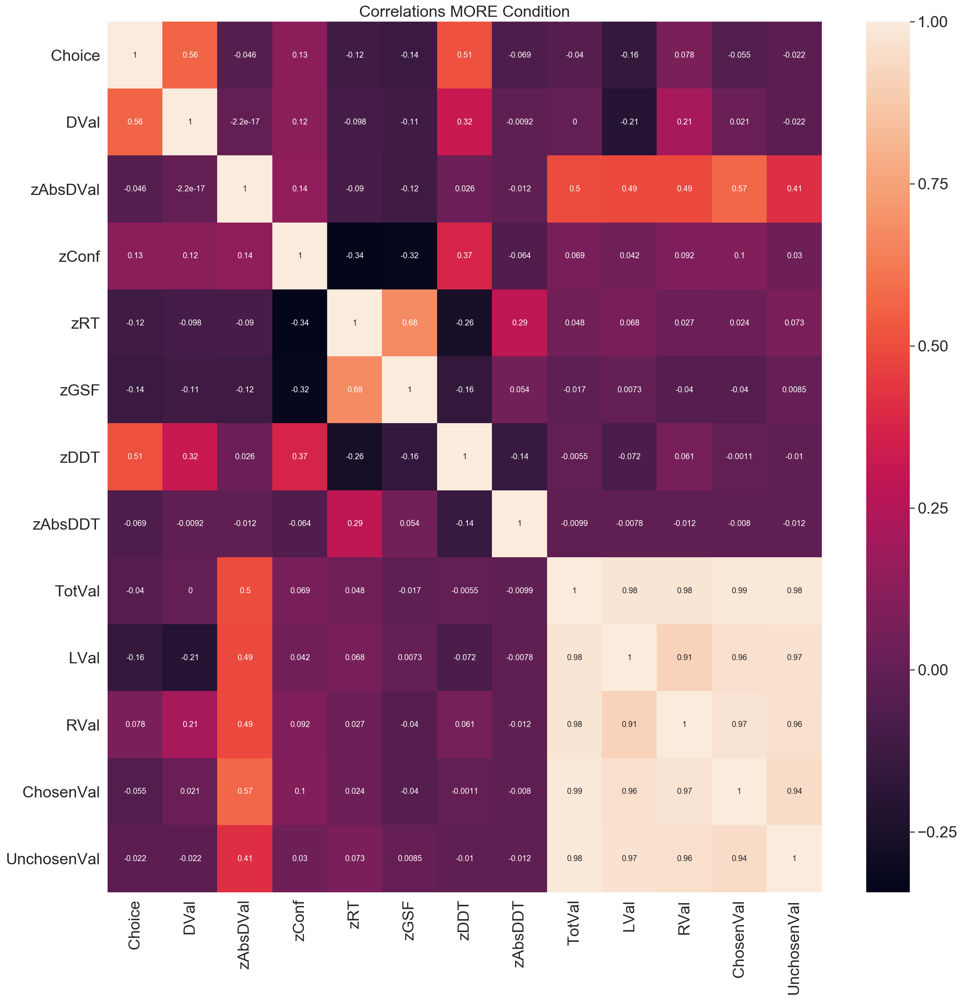

In [39]:
dataColsSelected = data_expL.loc[:,  ['Choice','DVal','zAbsDVal','zConf','zRT', 'zGSF', 
                                     'zDDT', 'zAbsDDT', 'TotVal', 'LVal','RVal', 
                                     'ChosenVal', 'UnchosenVal']]
dataColsSelected
data_corr = dataColsSelected.corr(method='pearson')
data_corr
# plot the heatmap
fig, ax = plt.subplots(figsize=(20,20))         # Sample figsize in inches
sns.heatmap(data_corr, 
       xticklabels=data_corr.columns,
       yticklabels=data_corr.columns, annot=True, annot_kws={"size": 10})

ax.set_title('Correlations MORE Condition',fontsize=20)

## LESS Condition Only

In [40]:
data_expD = data_exp1.loc[data_exp1['BlockCond'] == 2] 

### Insert the variables to calculate the correlation

In [41]:
x_variable = 'zAbsDVal'
x_varlabel = '|zΔV|'
y_variable = 'zRT'
y_varlabel =  'RT'

Pearson's r = -0.051 p =  0.001


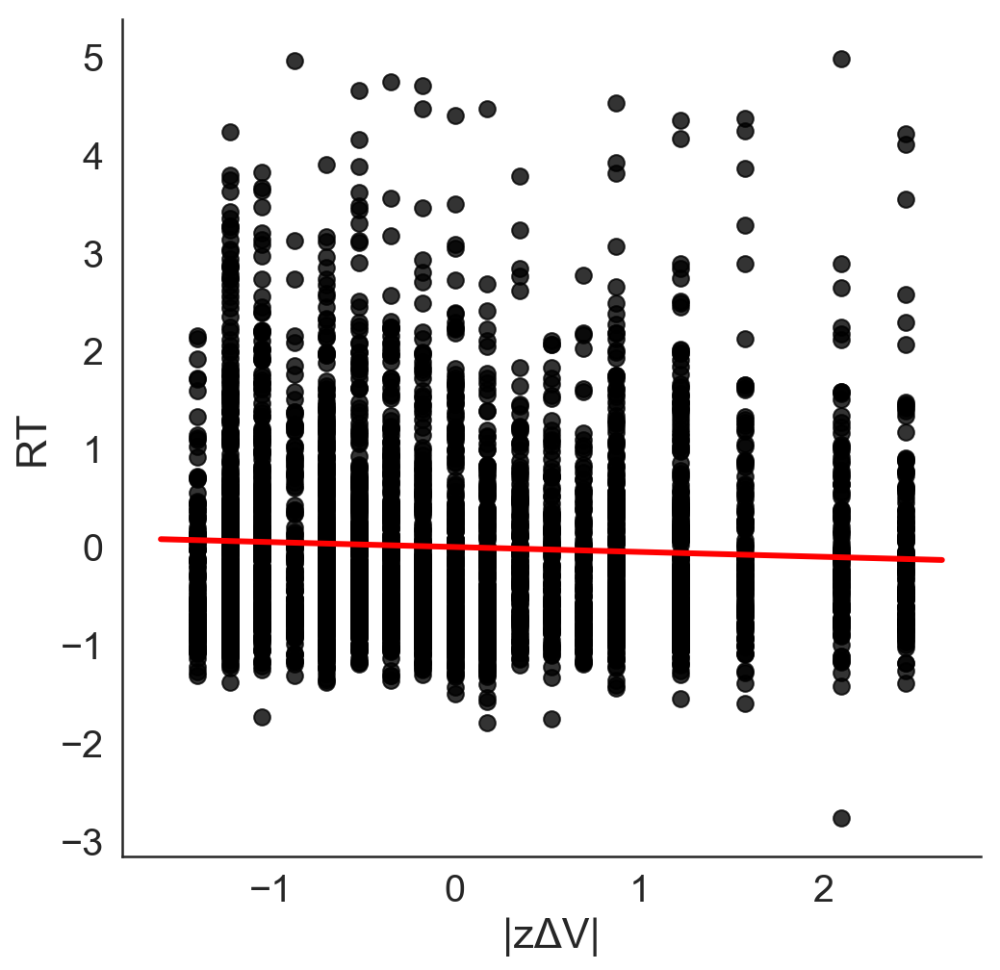

In [42]:
f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_expD, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_expD[x_variable]
y=data_expD[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Red', lw=3)
sns.despine()

results = pearsonr(data_expD[x_variable], data_expD[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Text(0.5, 1.0, 'Correlations LESS Condition')

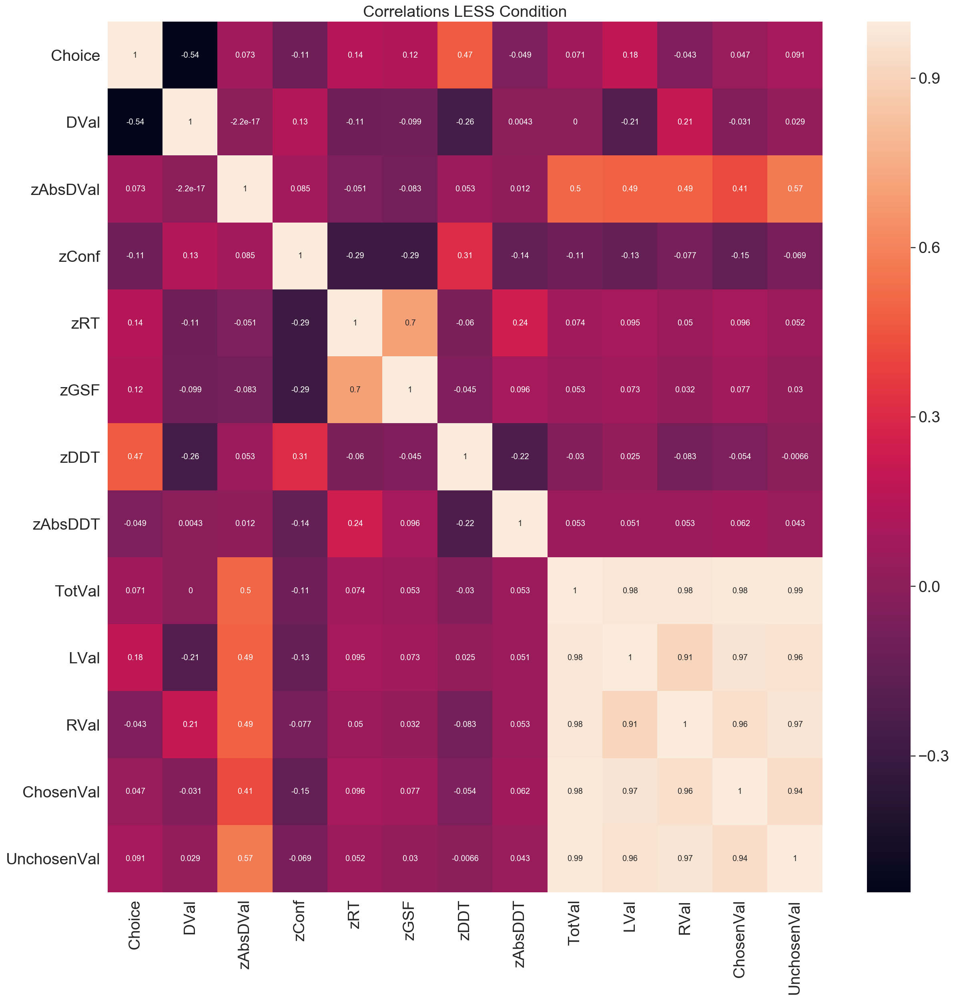

In [43]:
dataColsSelected = data_expD.loc[:,  ['Choice','DVal','zAbsDVal','zConf','zRT', 'zGSF', 
                                     'zDDT', 'zAbsDDT', 'TotVal', 'LVal','RVal', 
                                     'ChosenVal', 'UnchosenVal']]
dataColsSelected
data_corr = dataColsSelected.corr(method='pearson')
data_corr
# plot the heatmap
fig, ax = plt.subplots(figsize=(20,20))         # Sample figsize in inches
sns.heatmap(data_corr, 
       xticklabels=data_corr.columns,
       yticklabels=data_corr.columns, annot=True, annot_kws={"size": 10})

ax.set_title('Correlations LESS Condition',fontsize=20)

## [Go to Logistic plots for Familiarity ](#logisticFam)

<a id='log'></a>
# 2. Logistic Plots

<a id='logisticVal'></a>
## 2.1. Difference in value (DV) is calculated as (Value_Right  - Value_Left)

## Like Condition

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[1.14222004]] ; Intercept:  [0.24243036]
high measure:logit coef = [[2.16447107]] ; Intercept:  [0.73765473]


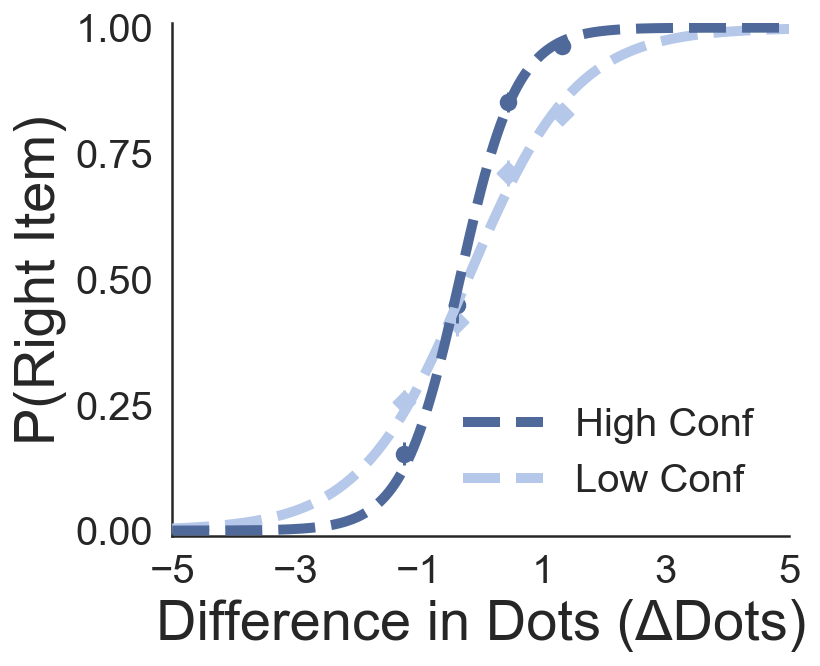

In [44]:
# Split by high/low conf
logisticplot_all('ConfSplit', 'High Conf', 'Low Conf', data=data_expL, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Dots (ΔDots)',
                 modhighcol='#4F6A9A', modlowcol='#B5C8E9', title='empty', parvar='Part')
plt.tight_layout()
plt.savefig('SavedFigures/PF2019_LogisticChoiceMore_32.svg', format='svg', dpi = 500 )

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[1.82450733]] ; Intercept:  [0.57726705]
high measure:logit coef = [[1.3444787]] ; Intercept:  [0.34575803]


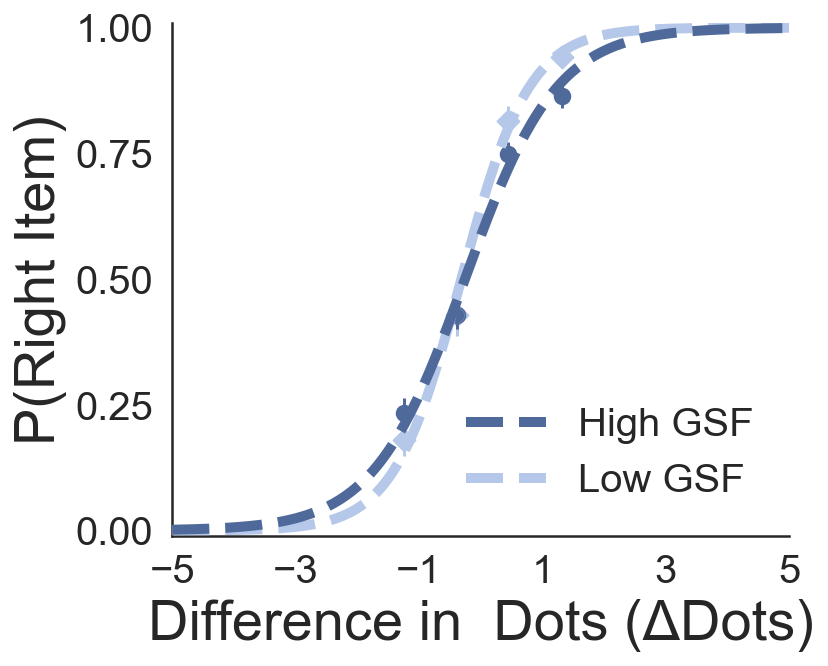

In [45]:
# Split by high/low gaze shift frequency
logisticplot_all('GSFSplit', 'High GSF', 'Low GSF', data=data_expL, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in  Dots (ΔDots)',
                 modhighcol='#4F6A9A', modlowcol='#B5C8E9', title='empty', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[1.37773467]] ; Intercept:  [-0.5366076]
high measure:logit coef = [[1.6548482]] ; Intercept:  [1.76859693]


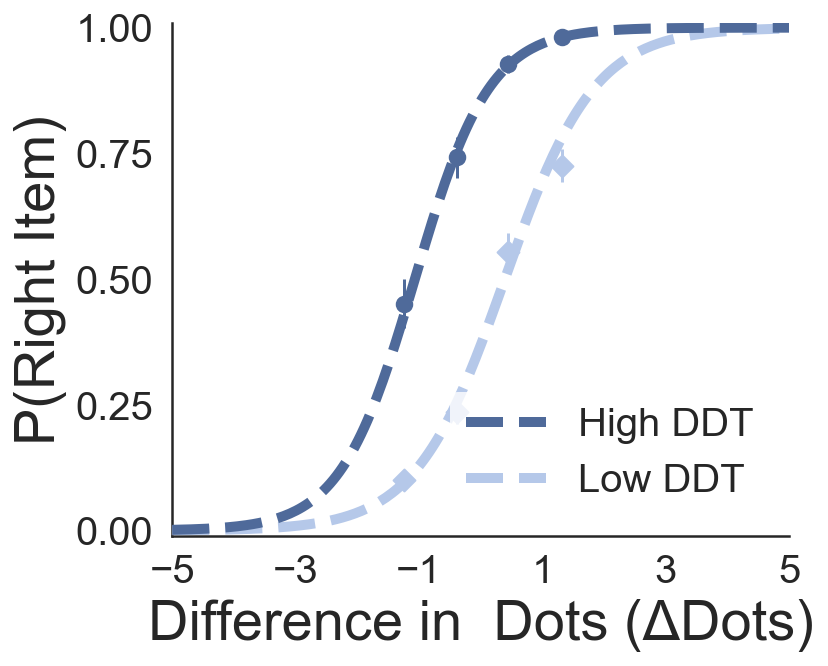

In [46]:
# Split by high/low dwelling time
logisticplot_all('DDTSplit', 'High DDT', 'Low DDT', data=data_expL, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in  Dots (ΔDots)',
                 modhighcol='#4F6A9A', modlowcol='#B5C8E9', title='empty', parvar='Part')
plt.tight_layout()

In [47]:
##absolute DDT
#logisticplot_all('absDDTMedSplit', 'High absDDT', 'Low absDDT', data=data_expL
#            , xaxis='zDV', yaxis='ChosenITM', ylab='P(Right Item)', xlab='Difference in Value (DV)',
#                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
#plt.tight_layout()

## Dislike Condition

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[-1.11853054]] ; Intercept:  [-0.50841699]
high measure:logit coef = [[-2.01086711]] ; Intercept:  [-0.79596039]


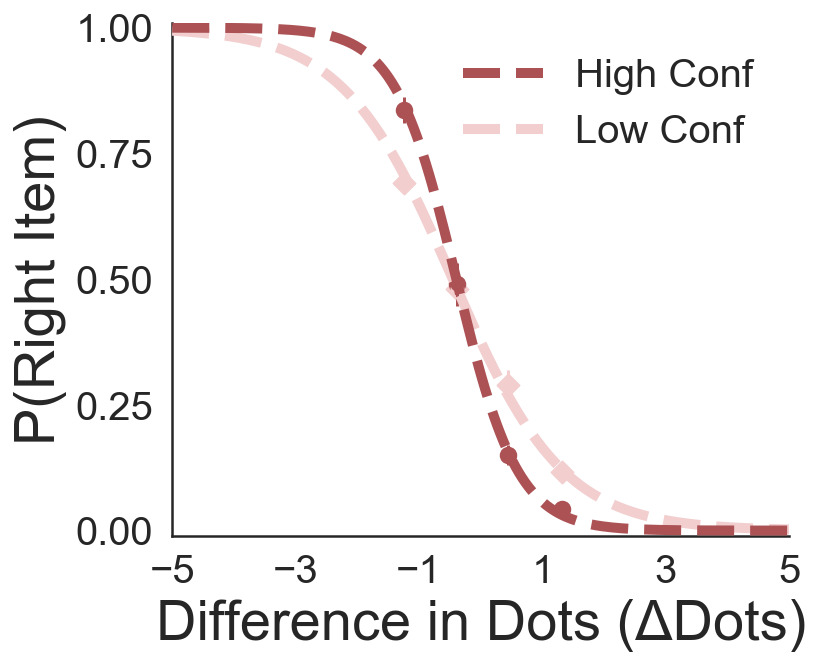

In [48]:
# Split by high/low conf
logisticplot_all('ConfSplit', 'High Conf', 'Low Conf', data=data_expD, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Dots (ΔDots)',
                 modhighcol='#AC5255', modlowcol='#F2CECF', title='empty', parvar='Part')
plt.tight_layout()
plt.savefig('SavedFigures/PF2019_LogisticChoiceLess_32.svg', format='svg', dpi = 500 )

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[-1.66300484]] ; Intercept:  [-1.03207684]
high measure:logit coef = [[-1.32605613]] ; Intercept:  [-0.31738005]


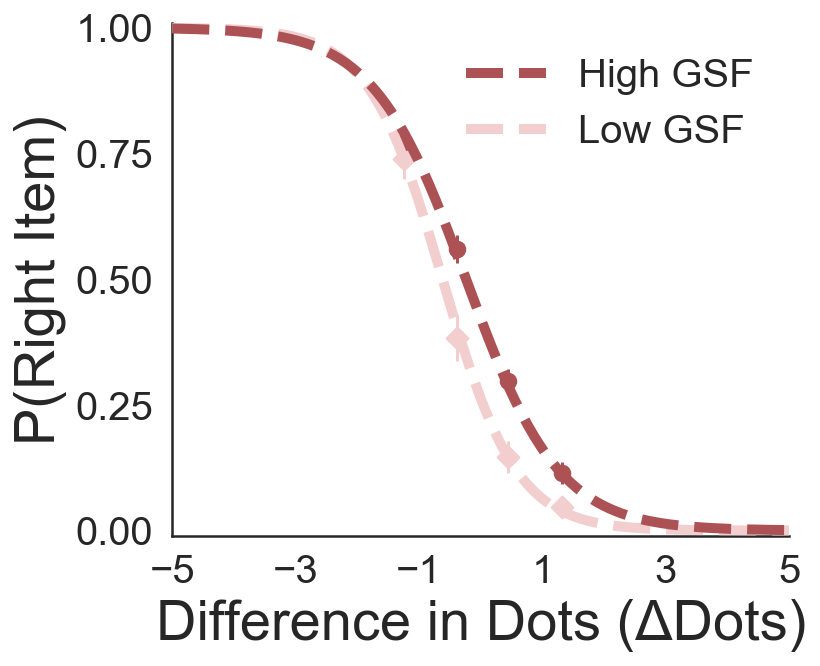

In [49]:
# Split by high/low gaze shift frequency
logisticplot_all('GSFSplit', 'High GSF', 'Low GSF', data=data_expD, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Dots (ΔDots)',
                 modhighcol='#AC5255', modlowcol='#F2CECF', title='empty', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[-1.21299295]] ; Intercept:  [-1.59325857]
high measure:logit coef = [[-1.67554119]] ; Intercept:  [0.16535891]


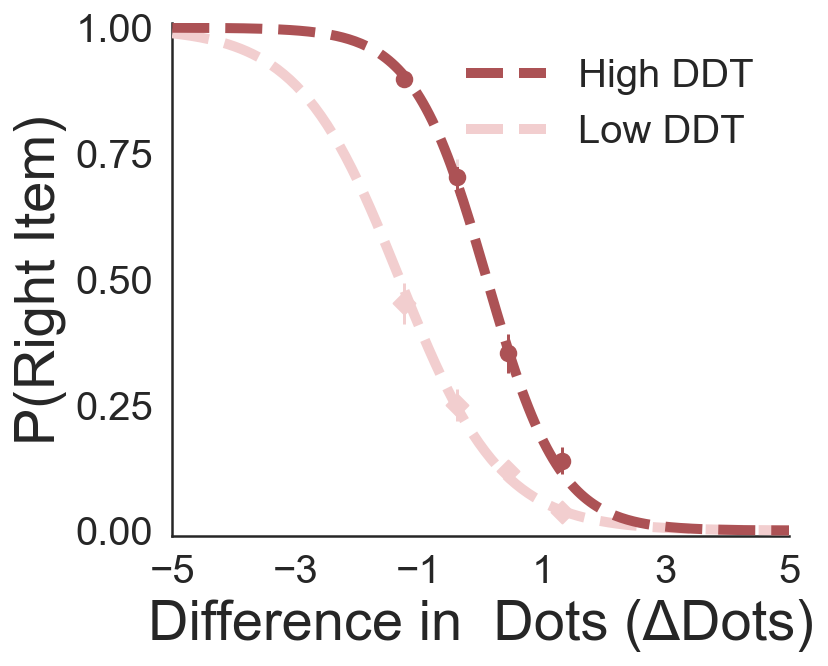

In [50]:
# Split by high/low dwelling time
logisticplot_all('DDTSplit', 'High DDT', 'Low DDT', data=data_expD, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in  Dots (ΔDots)',
                 modhighcol='#AC5255', modlowcol='#F2CECF', title='empty', parvar='Part')
plt.tight_layout()

# Check logistic regression values for individual participants (Confidence Split)

## Like Condition

In [51]:
coeficientes_like = logisticplot_all_sbj_slope('ConfSplit', 'High Conf', 'Low Conf', data=data_expL, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in  Dots (ΔDots)',
                 modhighcol='#4F6A9A', modlowcol='#B5C8E9', title='empty', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/p

## Dislike Condition

In [52]:
coeficientes_dislike = logisticplot_all_sbj_slope('ConfSplit', 'High Confidence', 'Low Confidence', data=data_expD, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in  Dots (ΔDots)',
                 modhighcol='#AC5255', modlowcol='#F2CECF', title='empty', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/p

## plot most and fewest logistic plots for presentation

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[1.14222004]] ; Intercept:  [0.24243036]
high measure:logit coef = [[2.16447107]] ; Intercept:  [0.73765473]


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[-1.11853054]] ; Intercept:  [-0.50841699]
high measure:logit coef = [[-2.01086711]] ; Intercept:  [-0.79596039]


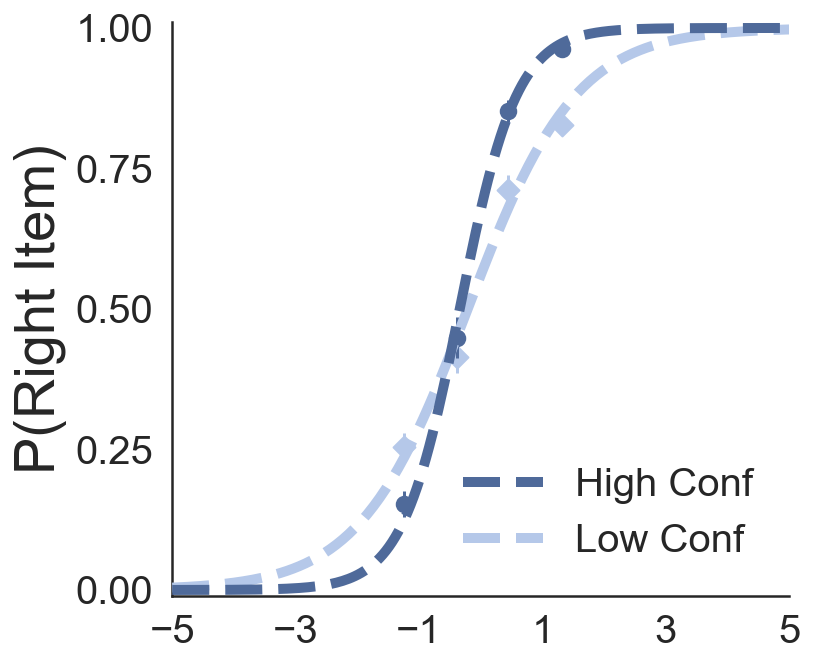

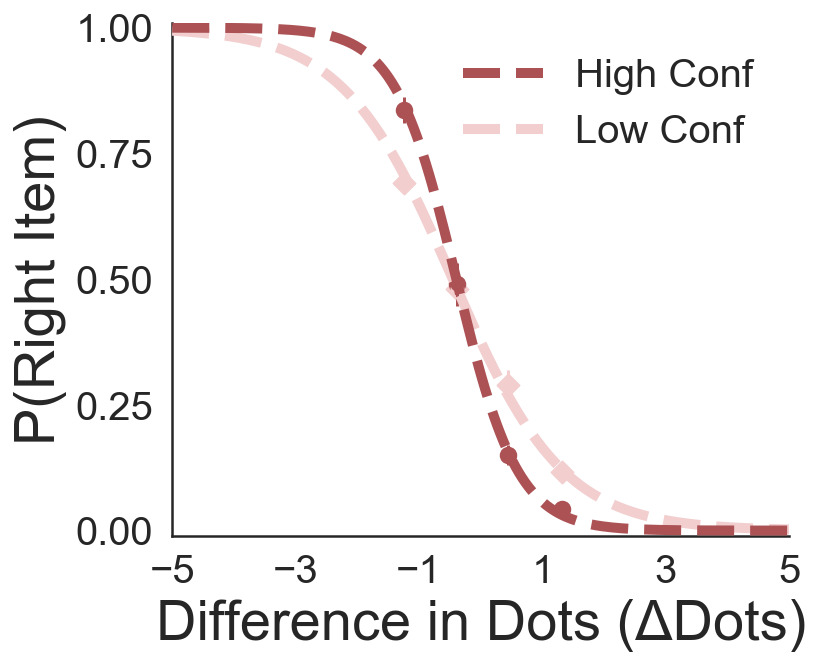

In [53]:
# Split by high/low conf
logisticplot_all('ConfSplit', 'High Conf', 'Low Conf', data=data_expL, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='',
                 modhighcol='#4F6A9A', modlowcol='#B5C8E9', title='empty', parvar='Part')
plt.tight_layout()
plt.savefig('SavedFigures/PF2019_LogisticChoiceMore_32.png', format='png', dpi = 500 )

# Split by high/low conf
logisticplot_all('ConfSplit', 'High Conf', 'Low Conf', data=data_expD, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Dots (ΔDots)',
                 modhighcol='#AC5255', modlowcol='#F2CECF', title='empty', parvar='Part')
plt.tight_layout()
plt.savefig('SavedFigures/PF2019_LogisticChoiceLess_32.png', format='png', dpi = 500 )

## plot slopes of logistic fits

In [54]:
like_slopes = coeficientes_like['All Coef'].values
dislike_slopes = coeficientes_dislike['All Coef'].values

In [55]:
def ttestsPlot(data1, data2,c1 ='#4F6A9A',c2 = '#AC5255',lab1 = "Like", lab2 = "Dislike",title = ''):

    # t-TEST
    diff = mean(data1) - mean(data2)
    [s, p] = stats.ttest_rel(data1,data2)
    print ("ChoiceSlopes: MeanL = "+ str(mean(data1))+ "; MeanD = "+ str(mean(data2))+"; [Like - Dislike] =  " + str(diff) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(p) )
    
        
    # PLOT LIKE AND DISLIKE VARIABILITY
        
    # Set seaborn style for the plot
    fig = plt.figure(figsize=[6,10])
    sns.set(style='white',font_scale=1.5)
    jittr = np.random.uniform(low=-0.3,high=0.3,size=len(data1))    
    plt.scatter([1]*len(data1)+jittr, data1, c= c1, alpha=0.7,label=lab1)
    plt.scatter([2]*len(data2)+jittr, data2, c= c2, alpha=0.7,label=lab2)
    
    ## add lines between slope points in like and dislike for each participant
    
    for i in range(len(data1)):
        plt.plot( [1 + jittr[i],2 + jittr[i]], [ data1[i] , data2[i]],'--', lw=1.0, color = 'black', alpha = 0.2)
        if data1[i]<data2[i]:
            print ("Participants with slope in Like < Dislike: " + str(i))
            
    
    #legend(loc = 'best')
    plt.xticks([1, 2,], [lab1, lab2],fontsize=25)
    plt.yticks(fontsize=20)

    plt.ylabel(title, fontsize=28)
    sns.despine()

ChoiceSlopes: MeanL = 1.7703374944891481; MeanD = -1.6989423541335542; [Like - Dislike] =  3.469279848622702; t =  22.22 ; p-value =1.330409761726837e-20


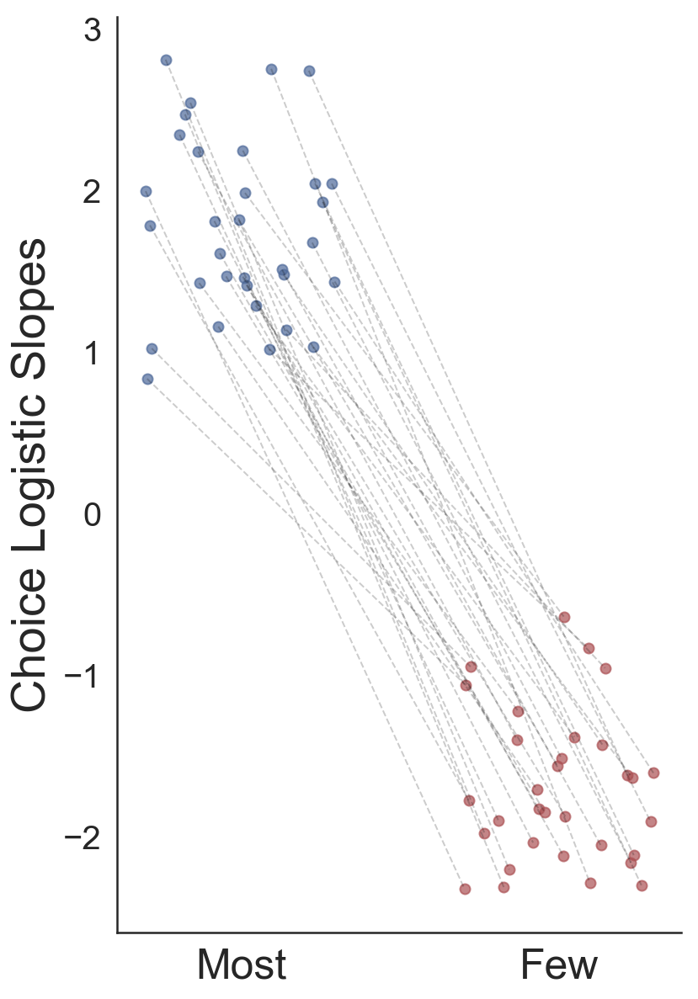

In [56]:
ttestsPlot(like_slopes, dislike_slopes,'#4F6A9A','#AC5255',"Most",  "Few",title = 'Choice Logistic Slopes')
plt.savefig('SavedFigures/SlopesChoiceMoreLessComparison.svg', format='svg', dpi = 500 )
plt.savefig('SavedFigures/SlopesChoiceMoreLessComparison.png', format='png', dpi = 500 )

In [57]:
## Substracting 

In [58]:
np.subtract(like_slopes, dislike_slopes)

array([3.37897977, 3.84576107, 2.90821902, 4.24289389, 2.6209589 ,
       3.43690009, 3.28778016, 2.66310228, 1.96938655, 4.22830711,
       2.86626369, 2.6466096 , 2.66848304, 4.74417352, 3.31693796,
       3.04037923, 3.55797195, 5.03696624, 4.15686079, 3.76194618,
       4.31539729, 1.89618393, 3.63712864, 3.94639998, 4.78469782,
       2.09347096, 1.85087322, 3.5738609 , 4.78110066, 4.36061972,
       3.83633745, 3.56200353])

In [59]:
Mean_like_slopes = like_slopes.mean()
Mean_dislike_slopes = dislike_slopes.mean()

abs_like_slopes = np.absolute(like_slopes)
abs_dislike_slopes = np.absolute(dislike_slopes)

abs_like_slopes

print ("Mean Slopes : LIKE : " + str(Mean_like_slopes) + "  /// DISLIKE : " +  str(Mean_dislike_slopes))

Mean Slopes : LIKE : 1.7703374944891481  /// DISLIKE : -1.6989423541335542


ChoiceSlopes: MeanL = 1.7703374944891481; MeanD = 1.6989423541335542; [Like - Dislike] =  0.07139514035559391; t =  0.79 ; p-value =0.4343327589834336
Participants with slope in Like < Dislike: 1
Participants with slope in Like < Dislike: 5
Participants with slope in Like < Dislike: 6
Participants with slope in Like < Dislike: 7
Participants with slope in Like < Dislike: 9
Participants with slope in Like < Dislike: 10
Participants with slope in Like < Dislike: 12
Participants with slope in Like < Dislike: 14
Participants with slope in Like < Dislike: 15
Participants with slope in Like < Dislike: 18
Participants with slope in Like < Dislike: 20
Participants with slope in Like < Dislike: 21
Participants with slope in Like < Dislike: 27
Participants with slope in Like < Dislike: 30
Participants with slope in Like < Dislike: 31


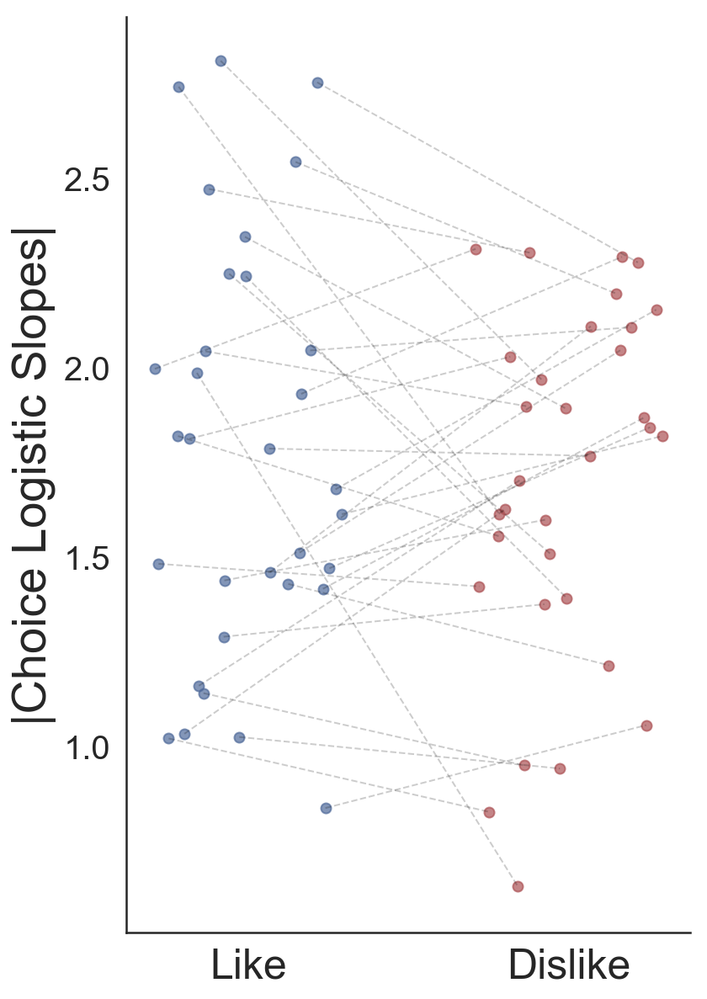

In [60]:
ttestsPlot(abs_like_slopes, abs_dislike_slopes,'#4F6A9A','#AC5255',"Like",  "Dislike",title = '|Choice Logistic Slopes|')

### Non significant difference in magnitude of the slope in LIKE vs DISLIKE

## Check differences between Like and Dislike blocks

In [61]:
partic = []
Correct_like = []
Correct_dislike = []
RT_like = []
RT_dislike = []
Conf_like = []
Conf_dislike = []

DDT_like = []
DDT_dislike = []
GSF_like = []
GSF_dislike = []
DFam_like = []
DFam_dislike = []
DVal_like = []
DVal_dislike = []

for i in unique(data_expL["Part"]):
    
    #if i== 2 or i ==26 or i==35:
    #    continue
        
    Correct_lik = data_expL.loc[(data_expL['Part'] == i),'Correct'].sum()/120
    Correct_dislik = data_expD.loc[(data_expD['Part'] == i),'Correct'].sum()/120
    
    RT_lik = data_expL.loc[(data_expL['Part'] == i),'RT'].sum()/120
    RT_dislik = data_expD.loc[(data_expD['Part'] == i),'RT'].sum()/120
    
    Conf_lik = data_expL.loc[(data_expL['Part'] == i),'zConf'].sum()/120
    Conf_dislik = data_expD.loc[(data_expD['Part'] == i),'zConf'].sum()/120

    DDT_lik = data_expL.loc[(data_expL['Part'] == i),'zAbsDDT'].sum()/120
    DDT_dislik = data_expD.loc[(data_expD['Part'] == i),'zAbsDDT'].sum()/120

    GSF_lik = data_expL.loc[(data_expL['Part'] == i),'zGSF'].sum()/120
    GSF_dislik = data_expD.loc[(data_expD['Part'] == i),'zGSF'].sum()/120
    
    Val_lik = data_expL.loc[(data_expL['Part'] == i),'LVal'].sum()
    Val_dislik = data_expD.loc[(data_expD['Part'] == i),'LVal'].sum()
    

    
    
    
    Correct_like.append(Correct_lik)
    Correct_dislike.append(Correct_dislik)
    RT_like.append(RT_lik)
    RT_dislike.append(RT_dislik)
    Conf_like.append(Conf_lik)
    Conf_dislike.append(Conf_dislik)
    DDT_like.append(DDT_lik)
    DDT_dislike.append(DDT_dislik)
    GSF_like.append(GSF_lik)
    GSF_dislike.append(GSF_dislik)

    DVal_like.append(Val_lik)
    DVal_dislike.append(Val_dislik)
    partic.append(i)




In [62]:
## Consider that participants

In [63]:
table_aux= np.column_stack((partic,DVal_like,DVal_dislike))
test_df = pd.DataFrame(table_aux,columns=['part','like','dislike'])
test_df


,part,like,dislike
0,1,9600,9600
1,2,9600,9600
2,3,9600,9600
3,4,9600,9600
4,5,9600,9600
5,6,9600,9600
6,7,9600,9600
7,8,9600,9600
8,9,9600,9600
9,10,9600,9600


In [64]:
# USING REPEATED MEASURES t-test
diff = mean(Correct_like) - mean(Correct_dislike)
[s, p] = stats.ttest_rel(Correct_like,Correct_dislike)
print ("Correct: MeanL = "+ str(round(mean(Correct_like),2))+ "; MeanD = "+ str(round(mean(Correct_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(round(p,5)))
p_correct = p

diff = mean(RT_like) - mean(RT_dislike)
[s, p] = stats.ttest_rel(RT_like,RT_dislike)
print ("RT: MeanL = "+ str(round(mean(RT_like),2))+ "; MeanD = "+ str(round(mean(RT_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(round(p,5) ))
p_rt = p

diff = mean(Conf_like) - mean(Conf_dislike)
[s, p] = stats.ttest_rel(Conf_like,Conf_dislike)
print ("Conf: MeanL = "+ str(round(mean(Conf_like),2))+ "; MeanD = "+ str(round(mean(Conf_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(round(p,5) ))
p_conf = p

diff = mean(DDT_like) - mean(DDT_dislike)
[s, p] = stats.ttest_rel(DDT_like,DDT_dislike)
print ("DDT: MeanL = "+ str(round(mean(DDT_like),2))+ "; MeanD = "+ str(round(mean(DDT_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) + "; t =  " + str(round(s,2))+ " ; p-value =" + str(round(p,5) ))
p_DDT = p

diff = mean(GSF_like) - mean(GSF_dislike)
[s, p] = stats.ttest_rel(GSF_like,GSF_dislike)
print ("GSF: MeanL = "+ str(round(mean(GSF_like),2))+ "; MeanD = "+ str(round(mean(GSF_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(round(p ,5)))
p_GSF = p

diff = mean(DVal_like) - mean(DVal_dislike)
s, p = stats.ttest_rel(DVal_like,DVal_dislike)
print ("DVAl: MeanL = "+ str(round(mean(DVal_like),2))+ "; MeanD = "+ str(round(mean(DVal_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(round(p,5) ))
p_DVal = p



Correct: MeanL = 0.77; MeanD = 0.74; [Like - Dislike] =  0.03; t =  2.46 ; p-value =0.01988
RT: MeanL = 4029.57; MeanD = 3975.59; [Like - Dislike] =  53.98; t =  0.32 ; p-value =0.75255
Conf: MeanL = 0.12; MeanD = -0.12; [Like - Dislike] =  0.24; t =  5.62 ; p-value =0.0
DDT: MeanL = 0.01; MeanD = -0.01; [Like - Dislike] =  0.02; t =  0.5 ; p-value =0.61727
GSF: MeanL = -0.09; MeanD = 0.09; [Like - Dislike] =  -0.17; t =  -4.15 ; p-value =0.00024
DVAl: MeanL = 9600.0; MeanD = 9600.0; [Like - Dislike] =  0.0; t =  nan ; p-value =nan


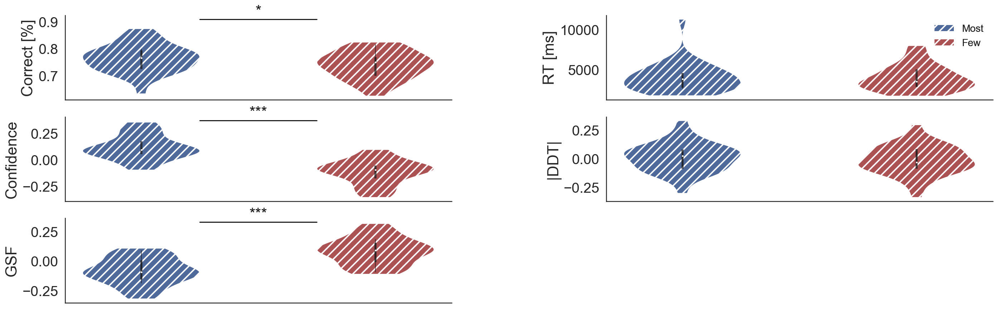

In [65]:
f = plt.figure(figsize=(20,10))
sns.set(style='white', font_scale=1.8)
#plt.suptitle('Like and dislike conditions')

#my_pal = {'#AC5255','#4F6A9A'}
#my_pal = {'#4F6A9A','#4F6A9A','#AC5255'}
my_pal = {0 :"b", 1 : "r"}
colr_dict = { 0:'#4F6A9A', 1:'#AC5255' }

wspace1 = 0.4
left1 = 0.3 
# FOR CORRECT

plt.subplot(421)

all_arr = [Correct_like,
          Correct_dislike]

# set up color and hatching on the violins
add_violin(all_arr)
#add_box_to_violin(plt,all_arr)
plt.xticks([1, 2], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 
plt.ylabel('Correct [%]')
plt.subplots_adjust(left=0, wspace=wspace1)

add_star1(Correct_like, Correct_dislike,p_correct)

# FOR RT
plt.subplot(422)
all_arr1 = [RT_like,
          RT_dislike]
# set up color and hatching on the violins
add_violin( all_arr1)
#add_box_to_violin(plt,all_arr1)
plt.xticks([1, 2], ['Most', 'Few'])
plt.ylabel('RT [ms]')

plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 

# PLot legend
patch1 = mpatches.Patch(facecolor=colr_dict[0],hatch=r"//", label="Most",edgecolor="white")
patch2 = mpatches.Patch(facecolor=colr_dict[1],hatch=r"//", label="Few",edgecolor="white")
mpl.rcParams['hatch.linewidth'] = 2
leg = plt.legend(handles=[patch1,patch2],fontsize=14,loc = "upper right")
leg.get_frame().set_facecolor('none')
leg.get_frame().set_linewidth(0.0)
plt.gca().add_artist(leg)

# FOR CONF
plt.subplot(423)
all_arr1 = [Conf_like,
          Conf_dislike]
add_violin( all_arr1)
#add_box_to_violin(plt,all_arr1)
plt.xticks([1,2], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 
plt.ylabel('Confidence')
add_star1(Conf_like, Conf_dislike,p_conf)

plt.subplots_adjust(left=0, wspace=wspace1)

# FOR DDT
plt.subplot(424)
all_arr1 = [DDT_like,
          DDT_dislike]
add_violin( all_arr1)
#add_box_to_violin(plt,all_arr1)
plt.xticks([1, 2,], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 
plt.ylabel('|DDT|')


# FOR GSF
plt.subplot(425)
all_arr1 = [GSF_like,
          GSF_dislike]
add_violin( all_arr1)
#add_box_to_violin(plt,all_arr1)
plt.xticks([0, 1], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 
plt.ylabel('GSF')

add_star1(GSF_like, GSF_dislike,p_GSF)


sns.despine()

plt.savefig(str('SavedFigures/BehaviouralComparison_MORE_LESS_32.png'), dpi = 200 )

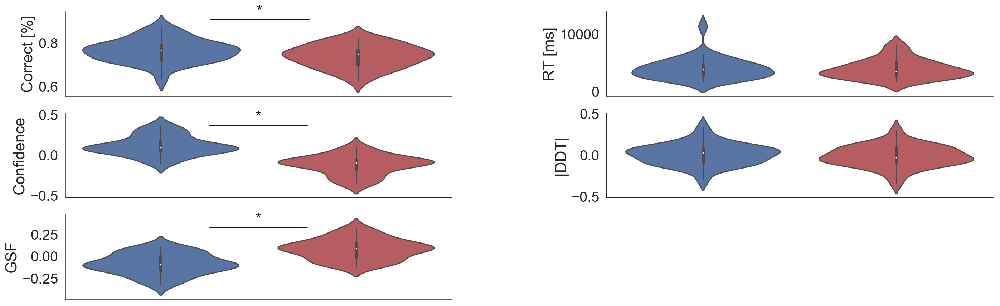

In [66]:
f = plt.figure(figsize=(20,10))
sns.set(style='white', font_scale=1.8)
#plt.suptitle('Like and dislike conditions')

#my_pal = {'#AC5255','#4F6A9A'}
#my_pal = {'#4F6A9A','#4F6A9A','#AC5255'}
my_pal = {0 :"b", 1 : "r"}


wspace1 = 0.4
left1 = 0.3 
# FOR CORRECT

plt.subplot(421)

all_arr = [Correct_like,
          Correct_dislike]
bplot = sns.violinplot(data=all_arr , palette=my_pal).set( ylabel='Correct [%]')
plt.xticks([0, 1,], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 

add_star(Correct_like, Correct_dislike)
plt.subplots_adjust(left=0, wspace=wspace1)

# FOR RT
plt.subplot(422)
all_arr1 = [RT_like,
          RT_dislike]
bplot = sns.violinplot(data=all_arr1, palette=my_pal).set(ylabel='RT [ms]')
plt.xticks([0, 1,], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False)



# FOR CONF
plt.subplot(423)
all_arr1 = [Conf_like,
          Conf_dislike]
bplot = sns.violinplot(data=all_arr1, palette=my_pal).set(ylabel='Confidence')
plt.xticks([0, 1,], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 

add_star(Conf_like, Conf_dislike)

plt.subplots_adjust(left=0, wspace=wspace1)

# FOR DDT
plt.subplot(424)
all_arr1 = [DDT_like,
          DDT_dislike]
bplot = sns.violinplot(data=all_arr1, palette=my_pal).set(ylabel='|DDT|')
plt.xticks([0, 1,], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 


# FOR GSF
plt.subplot(425)
all_arr1 = [GSF_like,
          GSF_dislike]
bplot = sns.violinplot(data=all_arr1, palette=my_pal).set(ylabel='GSF')
plt.xticks([0, 1], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 
add_star(GSF_like, GSF_dislike)

sns.despine()

#f.savefig(str('SavedFigures/BehaviouralComparisonLikeDislike_31.png'), dpi = 200 )

## Confidence split by error / mistake

In [67]:
Like_Correct = data_expL.loc[(data_expL['Correct'] == 1)]
Like_Error = data_expL.loc[(data_expL['Correct'] == 0)]

Dislike_Correct = data_expD.loc[(data_expD['Correct'] == 1)]
Dislike_Error = data_expD.loc[(data_expD['Correct'] == 0)]

Pearson's r = 0.169 p =  0.0
Pearson's r = -0.12 p =  0.0


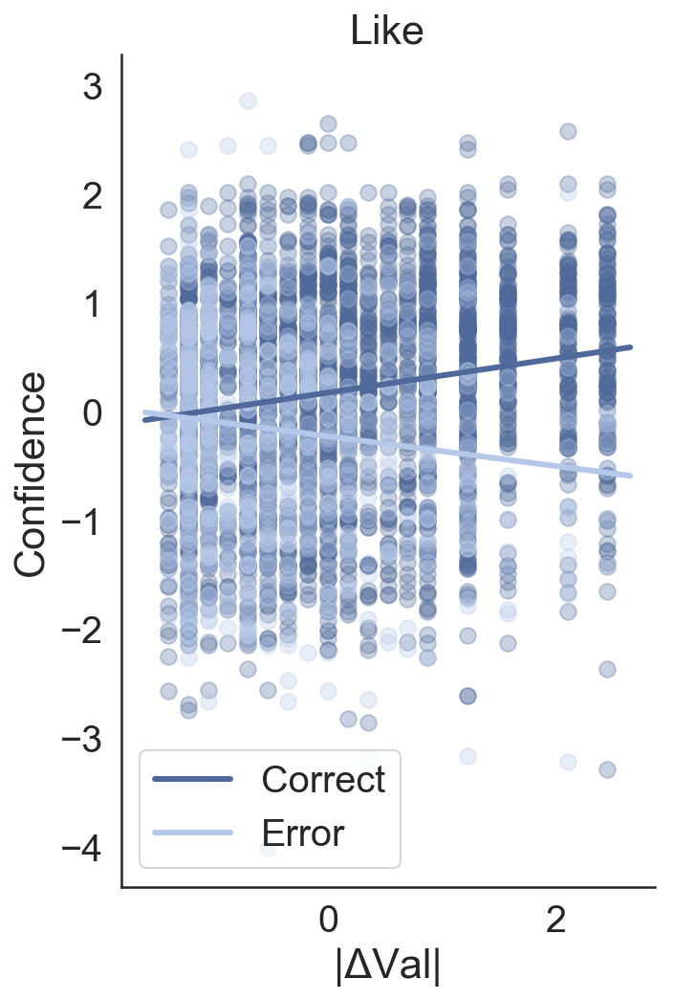

Pearson's r = 0.082 p =  0.0
Pearson's r = -0.103 p =  0.001


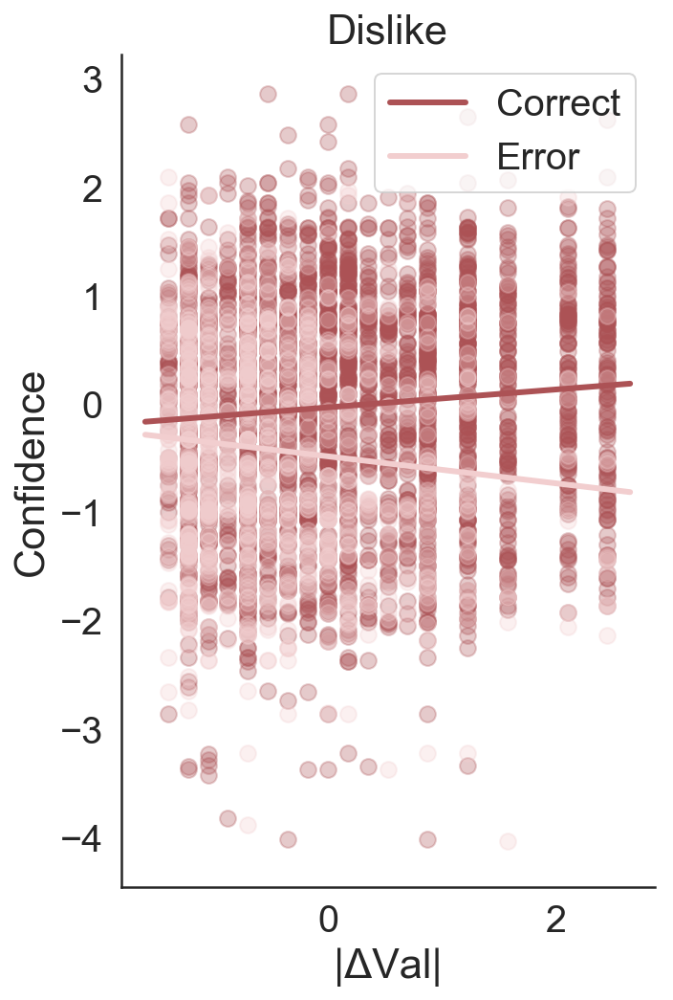

In [68]:
correl_plot2 (Like_Correct,Like_Error,'zAbsDVal','zConf',color1 = '#4F6A9A',color2 = '#B5C8E9',x_varlabel ='|ΔVal|' ,y_varlabel = 'Confidence', title = "Like")
correl_plot2 (Dislike_Correct,Dislike_Error,'zAbsDVal','zConf',color1 = '#AC5255',color2 = '#F2CECF',x_varlabel ='|ΔVal|' ,y_varlabel = 'Confidence', title = "Dislike")

## Check correct levels per particpants

In [69]:
all_arr1 = [ range(1,len(Correct_like)+1),
        Correct_like,
          Correct_dislike]
Corrects_all = list(map(list, zip(*all_arr1)))


In [70]:
pd.DataFrame(Corrects_all, columns = ['subject','more','less'])

,subject,more,less
0,1,0.800000,0.750000
1,2,0.800000,0.808333
2,3,0.775000,0.750000
3,4,0.741667,0.666667
4,5,0.766667,0.625000
5,6,0.775000,0.725000
6,7,0.725000,0.716667
7,8,0.708333,0.733333
8,9,0.691667,0.683333
9,10,0.783333,0.800000


## Time percent looking the most valuable item

In [71]:
def SE_calc (a):
    b = np.std(a)/np.sqrt(len(a))
    return b

In [72]:
LikeHighValGaze  =  []
LikeLowValGaze  =  []
DislikeHighValGaze  =  []
DislikeLowValGaze  =  []

LikeChoGaze  =  []
LikeUnchoGaze  =  []
DislikeChoGaze  =  []
DislikeUnchoGaze  =  []

for i in data_expL.Part.unique():
    
    Lik_MeanHValGazePC = data_expL.loc[(data_expL['Part'] == i)].HValGazePC.mean()
    Dlik_MeanHValGazePC = data_expD.loc[(data_expD['Part'] == i)].HValGazePC.mean()
    
    Lik_MeanLValGazePC = data_expL.loc[(data_expL['Part'] == i)].LValGazePC.mean()
    Dlik_MeanLValGazePC = data_expD.loc[(data_expD['Part'] == i)].LValGazePC.mean()
    
    LikeHighValGaze.append(Lik_MeanHValGazePC)
    LikeLowValGaze.append(Lik_MeanLValGazePC)
    DislikeHighValGaze.append(Dlik_MeanHValGazePC)
    DislikeLowValGaze.append(Dlik_MeanLValGazePC)
    
    
    Lik_MeanChoGazePC = data_expL.loc[(data_expL['Part'] == i)].ChosenGazePC.mean()
    Dlik_MeanChoGazePC = data_expD.loc[(data_expD['Part'] == i)].ChosenGazePC.mean()
    
    Lik_MeanUnchoGazePC = data_expL.loc[(data_expL['Part'] == i)].UnchosenGazePC.mean()
    Dlik_MeanUnchoGazePC = data_expD.loc[(data_expD['Part'] == i)].UnchosenGazePC.mean()
    
    LikeChoGaze.append(Lik_MeanChoGazePC)
    LikeUnchoGaze.append(Lik_MeanUnchoGazePC)
    DislikeChoGaze.append(Dlik_MeanChoGazePC)
    DislikeUnchoGaze.append(Dlik_MeanUnchoGazePC)
    
    
error_LikeHighValGaze  = SE_calc(LikeHighValGaze)
error_LikeLowValGaze  =  SE_calc(LikeLowValGaze)
error_DislikeHighValGaze  = SE_calc(DislikeHighValGaze)
error_DislikeLowValGaze  =  SE_calc(DislikeLowValGaze)

avg_LikeHighValGaze  = np.mean(LikeHighValGaze)
avg_LikeLowValGaze  =   np.mean(LikeLowValGaze)
avg_DislikeHighValGaze  =  np.mean(DislikeHighValGaze)
avg_DislikeLowValGaze  =   np.mean(DislikeLowValGaze)

error_LikeChoGaze  = SE_calc(LikeChoGaze)
error_LikeUnchoGaze  =  SE_calc(LikeUnchoGaze)
error_DislikeChoGaze  = SE_calc(DislikeChoGaze)
error_DislikeUnchoGaze  =  SE_calc(DislikeUnchoGaze)

avg_LikeChoGaze  = np.mean(LikeChoGaze)
avg_LikeUnchoGaze  =   np.mean(LikeUnchoGaze)
avg_DislikeChoGaze  =  np.mean(DislikeChoGaze)
avg_DislikeUnchoGaze =   np.mean(DislikeUnchoGaze)

In [73]:
# t-test
diff = avg_LikeHighValGaze - avg_DislikeHighValGaze
[s1, p1] = stats.ttest_rel(LikeHighValGaze,DislikeHighValGaze)
print (" Like High Val Gaze =  "+ str(round(mean(avg_LikeHighValGaze),2))+ " ; Mean Dislike High Val Gaze =  "+ str(round(mean(avg_DislikeHighValGaze),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s1,2)) + " ; p-value =" + str(round(p1,2) ))

diff = avg_LikeLowValGaze - avg_DislikeLowValGaze
[s2, p2] = stats.ttest_rel(LikeLowValGaze,DislikeLowValGaze)
print (" Like High Val Gaze =  "+ str(round(mean(avg_LikeLowValGaze),2))+ " ; Mean Dislike High Val Gaze =  "+ str(round(mean(avg_DislikeLowValGaze),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s2,2)) + " ; p-value =" + str(round(p2,2) ))


diff = avg_LikeHighValGaze - avg_LikeLowValGaze
[s3, p3] = stats.ttest_rel(LikeHighValGaze,LikeLowValGaze)
print (" Like High=  "+ str(round(mean(avg_LikeHighValGaze),2))+ " ;   Low  =  "+ str(round(mean(avg_LikeLowValGaze),2))+"; [High - low] =  " + str(round(diff,2)) +"; t =  " + str(round(s3,2)) + " ; p-value =" + str(round(p3,2) ))

diff = avg_DislikeHighValGaze - avg_DislikeLowValGaze
[s4, p4] = stats.ttest_rel(DislikeHighValGaze,DislikeLowValGaze)
print (" DisLike High=  "+ str(round(mean(avg_DislikeHighValGaze),2))+ " ;   Low  =  "+ str(round(mean(avg_DislikeLowValGaze),2))+"; [high - low] =  " + str(round(diff,2)) +"; t =  " + str(round(s4,2)) + " ; p-value =" + str(round(p4,2) ))



 Like High Val Gaze =  0.55 ; Mean Dislike High Val Gaze =  0.47; [Like - Dislike] =  0.08; t =  15.32 ; p-value =0.0
 Like High Val Gaze =  0.45 ; Mean Dislike High Val Gaze =  0.53; [Like - Dislike] =  -0.08; t =  -15.32 ; p-value =0.0
 Like High=  0.55 ;   Low  =  0.45; [High - low] =  0.1; t =  13.85 ; p-value =0.0
 DisLike High=  0.47 ;   Low  =  0.53; [high - low] =  -0.07; t =  -10.88 ; p-value =0.0


In [74]:
 
# Add asterisk
def add_star2(RT_like, RT_dislike, p,x1,x2):
    
    if p<0.001:
        star_text = '***'
    elif p<0.01:
        star_text = '**'
    elif p<0.05:
        star_text = '*'
    y_max = max([np.max(RT_like), np.max(RT_dislike)])
    y, h, col = y_max + y_max/50, y_max/50, 'k'
    plt.plot( [x1+0.8, x2-0.8], [ y+h, y+h], lw=1.5, c=col)
    plt.text((x1+x2)*.5, y+h, star_text, ha='center', va='bottom', color=col)

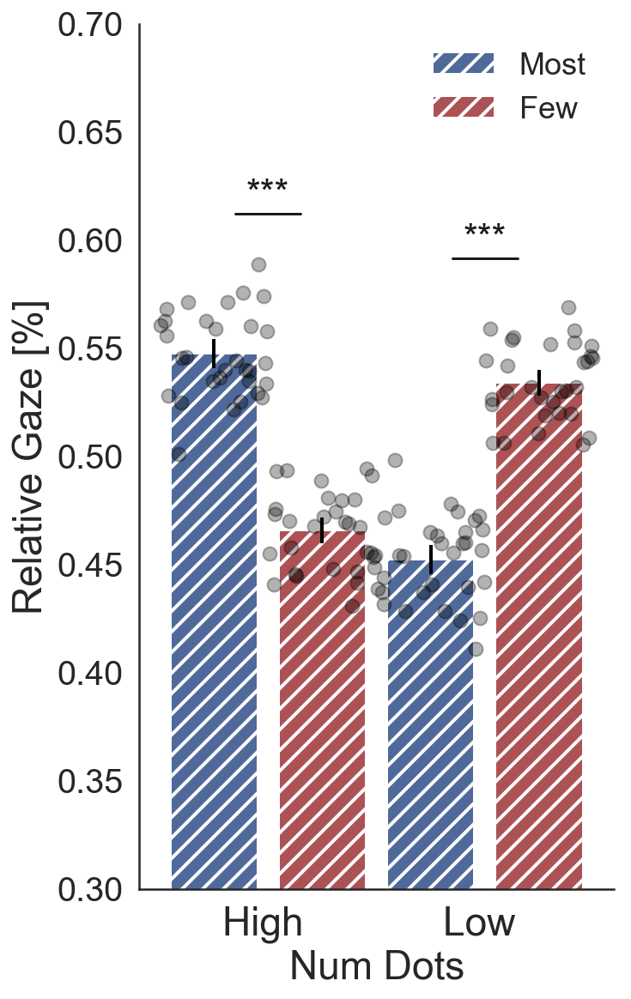

In [75]:
fig = plt.figure(figsize=[6,10])
gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)

ax = fig.add_subplot(gs[0,0])
# bars

ax.bar(1, np.mean(LikeHighValGaze), width=0.8,color= '#4F6A9A',hatch=r'//')
ax.bar(2, np.mean(DislikeHighValGaze), width=0.8,color='#AC5255',hatch=r'//')
ax.bar(3, np.mean(LikeLowValGaze), width=0.8,color= '#4F6A9A',hatch=r'//')
ax.bar(4, np.mean(DislikeLowValGaze), width=0.8,color='#AC5255',hatch=r'//')

# error
ax.errorbar(1, np.mean(LikeHighValGaze), yerr=error_LikeHighValGaze*1.96, lw=2, color='#000000')
ax.errorbar(2, np.mean(DislikeHighValGaze), yerr=error_DislikeHighValGaze*1.96, lw=2, color='#000000')
ax.errorbar(3, np.mean(LikeLowValGaze), yerr=error_LikeLowValGaze*1.96, lw=2, color='#000000')
ax.errorbar(4, np.mean(DislikeLowValGaze), yerr=error_DislikeLowValGaze*1.96, lw=2, color='#000000')
       

for i in range(1,len(LikeHighValGaze)):
        jittr = np.random.uniform(low=-0.5,high=0.5)
        ax.plot(1+jittr, LikeHighValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(2+jittr, DislikeHighValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(3+jittr, LikeLowValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(4+jittr, DislikeLowValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")

ax.set_xticks([1.5,3.5])
ax.set_xticklabels(["High ","Low "], rotation=0, fontsize=23)
ax.set_ylabel('Relative Gaze [%]', fontsize=23)
ax.set_xlabel('Num Dots', fontsize=23)

ax.set_ylim([0.3,0.70])

sns.despine()

patch1 = mpatches.Patch(facecolor='#4F6A9A',hatch=r'//', label='Most')
patch2 = mpatches.Patch(facecolor='#AC5255',hatch=r'//', label='Few')
leg = plt.legend(handles=[patch1,patch2],fontsize=18,loc = "upper right",frameon = False)

add_star2(LikeHighValGaze, DislikeHighValGaze, p1,1,2)
add_star2(LikeLowValGaze, DislikeLowValGaze, p1,3,4)

#ax.errorbar(position, regtable.loc['coefficient', Coefficient],
#yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color='#000000')

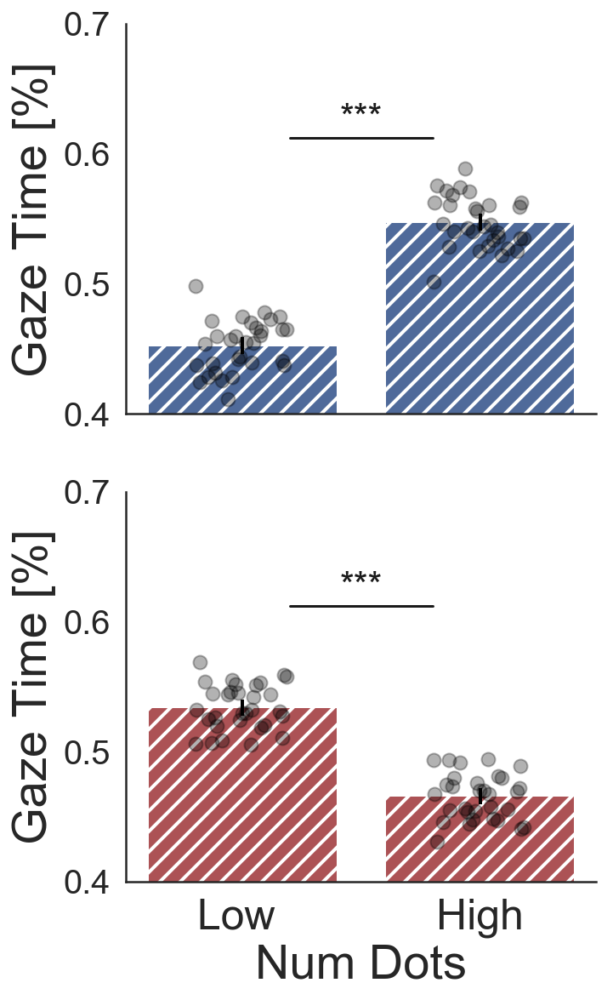

In [76]:
fig = plt.figure(figsize=[6,10])
gs = GridSpec(2,1,bottom=0.18,left=0.18,right=0.82)

ax1 = fig.add_subplot(gs[0,0])
add_star2(LikeLowValGaze,LikeHighValGaze, p3,1,2)
plt.yticks(fontsize=20)


ax2 = fig.add_subplot(gs[1,0])

# bars
ax1.bar(2, np.mean(LikeHighValGaze), width=0.8,color= '#4F6A9A',hatch=r'//')
ax1.bar(1, np.mean(LikeLowValGaze), width=0.8,color= '#4F6A9A',hatch=r'//')

ax2.bar(2, np.mean(DislikeHighValGaze), width=0.8,color='#AC5255',hatch=r'//')
ax2.bar(1, np.mean(DislikeLowValGaze), width=0.8,color='#AC5255',hatch=r'//')


# error
ax1.errorbar(2, np.mean(LikeHighValGaze), yerr=error_LikeHighValGaze*1.96, lw=2, color='#000000')
ax1.errorbar(1, np.mean(LikeLowValGaze), yerr=error_LikeLowValGaze*1.96, lw=2, color='#000000')

ax2.errorbar(2, np.mean(DislikeHighValGaze), yerr=error_DislikeHighValGaze*1.96, lw=2, color='#000000')
ax2.errorbar(1, np.mean(DislikeLowValGaze), yerr=error_DislikeLowValGaze*1.96, lw=2, color='#000000')
     
    
for i in range(1,len(LikeHighValGaze)):
        jittr = np.random.uniform(low=-0.2,high=0.2)
        ax1.plot(2+jittr, LikeHighValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax1.plot(1+jittr, LikeLowValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax2.plot(2+jittr, DislikeHighValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax2.plot(1+jittr, DislikeLowValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")

        
ax1.set_xticks([1,2])
ax1.set_xticklabels([], rotation=0, fontsize=25)
ax1.set_ylabel('Gaze Time [%]', fontsize=28)
#ax1.set_xticklabels([], rotation=0, fontsize=25)
        
ax2.set_xticks([1,2])
ax2.set_xticklabels(["Low ","High"], rotation=0, fontsize=25)
ax2.set_ylabel('Gaze Time [%]', fontsize=28)
ax2.set_xlabel('Num Dots', fontsize=28)

ax1.set_ylim([0.4,0.70])
ax2.set_ylim([0.4,0.70])

plt.yticks(fontsize=20)


sns.despine()

#patch1 = mpatches.Patch(facecolor='#4F6A9A',hatch=r'//', label='Most')
#patch2 = mpatches.Patch(facecolor='#AC5255',hatch=r'//', label='Few')
#leg = plt.legend(handles=[patch1,patch2],fontsize=18,loc = "upper right",frameon = False)

add_star2(LikeLowValGaze,LikeHighValGaze, p4,1,2)


fig.savefig(str('SavedFigures/BehavGazeMoreLess_32.png'), dpi = 200 )

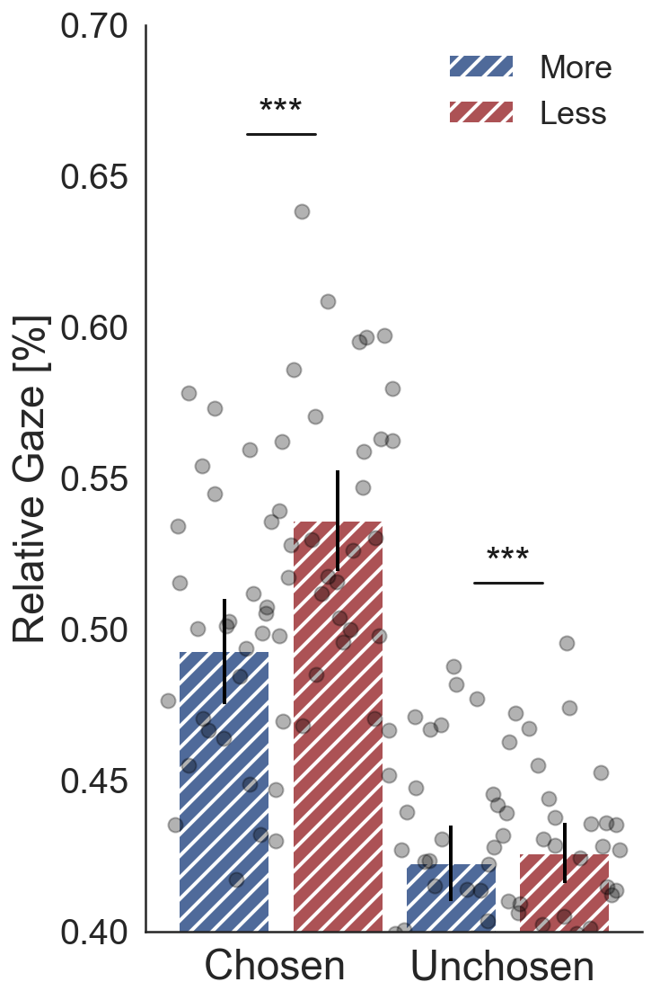

In [77]:
# plot for choice

fig = plt.figure(figsize=[6,10])
gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)

ax = fig.add_subplot(gs[0,0])
# bars
ax.bar(1, np.mean(LikeChoGaze), width=0.8,color= '#4F6A9A',hatch=r'//')
ax.bar(2, np.mean(DislikeChoGaze), width=0.8,color='#AC5255',hatch=r'//')
ax.bar(3, np.mean(LikeUnchoGaze), width=0.8,color= '#4F6A9A',hatch=r'//')
ax.bar(4, np.mean(DislikeUnchoGaze), width=0.8,color='#AC5255',hatch=r'//')

# error
ax.errorbar(1, np.mean(LikeChoGaze), yerr=error_LikeChoGaze*1.96, lw=2, color='#000000')
ax.errorbar(2, np.mean(DislikeChoGaze), yerr=error_DislikeChoGaze*1.96, lw=2, color='#000000')
ax.errorbar(3, np.mean(LikeUnchoGaze), yerr=error_LikeUnchoGaze*1.96, lw=2, color='#000000')
ax.errorbar(4, np.mean(DislikeUnchoGaze), yerr=error_DislikeUnchoGaze*1.96, lw=2, color='#000000')
       

for i in range(1,len(LikeHighValGaze)):
        jittr = np.random.uniform(low=-0.5,high=0.5)
        ax.plot(1+jittr, LikeChoGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(2+jittr, DislikeChoGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(3+jittr, LikeUnchoGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(4+jittr, DislikeUnchoGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")

ax.set_xticks([1.5,3.5])
ax.set_xticklabels(["Chosen ","Unchosen "], rotation=0, fontsize=23)
ax.set_ylabel('Relative Gaze [%]', fontsize=23)
ax.set_xlabel('', fontsize=23)

ax.set_ylim([0.4,0.70])

sns.despine()

patch1 = mpatches.Patch(facecolor='#4F6A9A',hatch=r'//', label='More')
patch2 = mpatches.Patch(facecolor='#AC5255',hatch=r'//', label='Less')
leg = plt.legend(handles=[patch1,patch2],fontsize=18,loc = "upper right",frameon = False)

add_star2(LikeChoGaze, DislikeChoGaze, p1,1,2)
add_star2(LikeUnchoGaze, DislikeUnchoGaze, p1,3,4)

#ax.errorbar(position, regtable.loc['coefficient', Coefficient],
#yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color='#000000')

<a id='reg'></a>
# 3. Regression Analysis
 

## Loading data in R

In [78]:
%R -i data_exp1
data_exp1

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  res = PandasDataFrame.from_items(items)


,Unnamed: 0,Part,TrialN,PairID,LVal,RVal,Choice,RT,Conf,ConfRT,...,HValGazePC,LValGazePC,zLGazePC,zRGazePC,zHValGazePC,zLValGazePC,ChosenGazePC,UnchosenGazePC,zChosenGazePC,zUnchosenGazePC
0,0,1,1,49,110,131,0,4261.735,74,1584.966,...,0.440599,0.559401,-0.089598,0.089598,-0.505890,0.505890,0.559401,0.440599,-0.089598,0.178471
1,1,1,2,13,47,50,1,3559.258,54,1864.387,...,0.434917,0.565083,-0.050047,0.050047,-0.541534,0.541534,0.565083,0.565083,-0.050047,1.085872
2,2,1,3,16,50,44,1,3754.464,64,3778.807,...,0.507407,0.492593,-0.451559,0.451559,-0.086746,0.086746,0.507407,0.507407,-0.451559,0.665460
3,3,1,4,7,57,50,0,2431.751,84,3064.179,...,0.823097,0.176903,1.746147,-1.746147,1.893824,-1.893824,0.823097,0.176903,1.746147,-1.743687
4,4,1,5,18,42,50,0,2199.342,44,2850.845,...,0.244806,0.755194,1.273434,-1.273434,-1.734254,1.734254,0.755194,0.244806,1.273434,-1.248722
5,5,1,6,51,108,110,0,3269.922,44,3745.039,...,0.284308,0.715692,0.998435,-0.998435,-1.486425,1.486425,0.715692,0.284308,0.998435,-0.960779
6,6,1,7,31,78,80,0,6606.698,74,2425.516,...,0.398754,0.601246,0.201709,-0.201709,-0.768416,0.768416,0.601246,0.398754,0.201709,-0.126548
7,7,1,8,58,110,92,1,3642.146,74,3030.001,...,0.690563,0.309437,0.823495,-0.823495,1.062331,-1.062331,0.690563,0.690563,0.823495,2.000533
8,8,1,9,12,50,48,1,5213.480,54,2229.314,...,0.544970,0.455030,-0.190066,0.190066,0.148910,-0.148910,0.544970,0.544970,-0.190066,0.939261
9,9,1,10,54,110,101,1,5511.334,34,1727.761,...,0.420875,0.579125,-1.053960,1.053960,-0.629630,0.629630,0.420875,0.420875,-1.053960,0.034702


In [79]:
%%R
library(lme4)
#library(car)
library(optimx)
library(ggplot2)
library(MASS)
library(broom)
library(dplyr)
library(reshape2)
library(arm)
library(multcomp)
library(pbkrtest)

In [80]:
%R
##Change Column name for better regression presentation
#colnames(data_exp1)[which(names(data_exp1) == "zChoiceRT")] <- "zRT"
#colnames(data_exp1)[which(names(data_exp1) == "ChoiceRT")] <- "RT"

In [81]:
%%R
# Separating the data for both conditions 
data_exp1_Like <- data_exp1[ which(data_exp1$BlockCond=='1'), ]
data_exp1_DisLike <- data_exp1[ which(data_exp1$BlockCond=='2'), ]

<a id='regCond'></a>
# 3.1.  Regressions per Condition (Like/Dislike)
## ChoiceITM regression

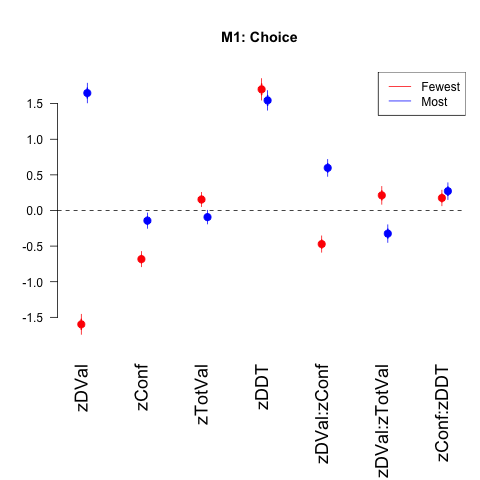

In [82]:
%%R
# Figure replicating Folke 2016.

title_plot = "M1: Choice "

ModelChoiceL_1 <- glm(Choice ~ zDVal + zConf + zTotVal + zDVal:zConf + zDVal:zTotVal + zDDT + zConf:zDDT, data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_1 <- glm(Choice ~ zDVal + zConf + zTotVal + zDVal:zConf + zDVal:zTotVal + zDDT + zConf:zDDT, data=data_exp1_DisLike, family=binomial(link="logit"))

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1.8, 1.8) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Fewest", "Most"),col=c("red", "blue"), lty=1:1, cex=1)

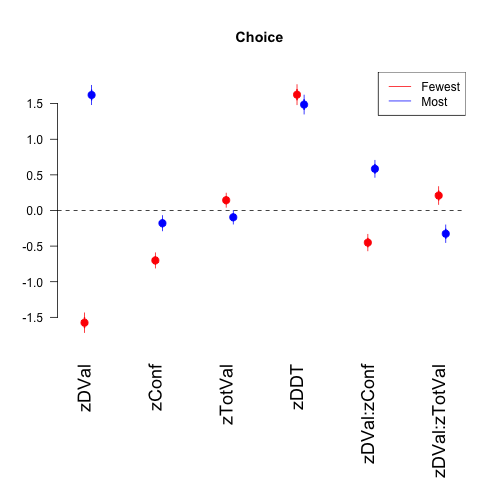

In [83]:
    %%R
    # Figure replicating Folke 2016.

    title_plot = "Choice "

    ModelChoiceL_1 <- glm(Choice ~ zDVal + zConf + zTotVal + zDVal:zConf + zDVal:zTotVal + zDDT , data=data_exp1_Like, family=binomial(link="logit"))
    ModelChoiceD_1 <- glm(Choice ~ zDVal + zConf + zTotVal + zDVal:zConf + zDVal:zTotVal + zDDT , data=data_exp1_DisLike, family=binomial(link="logit"))

    coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1.8, 1.8) ,main=title_plot)
    coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
    legend("topright",  legend=c("Fewest", "Most"),col=c("red", "blue"), lty=1:1, cex=1)

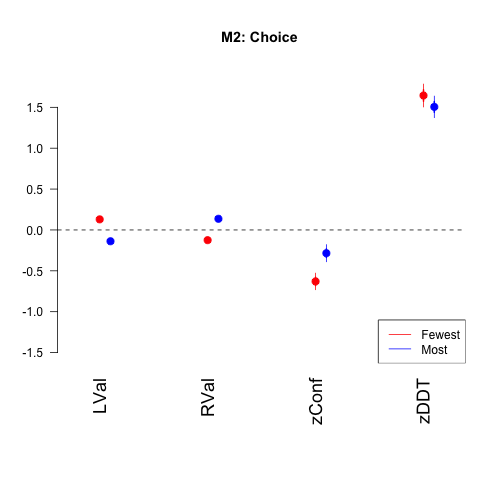

In [84]:
%%R
title_plot = ("M2: Choice ")

ModelChoiceL_3 <- glm(Choice ~ LVal + RVal + zConf + zTotVal+ zDDT , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_3 <- glm(Choice ~ LVal + RVal + zConf + zTotVal + zDDT , data=data_exp1_DisLike, family=binomial(link="logit"))

#print(summary(ModelChoiceL_3))

coefplot(ModelChoiceD_3,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1.5, 1.8) ,main=title_plot)
coefplot(ModelChoiceL_3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("bottomright",  legend=c("Fewest", "Most"),col=c("red", "blue"), lty=1:1, cex=1)

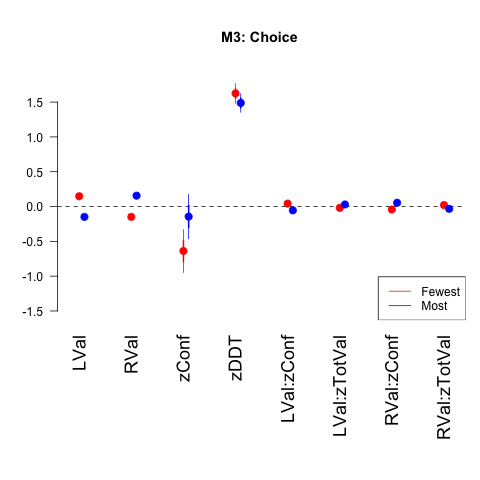

In [85]:
%%R

title_plot = ("M3: Choice ")

ModelChoiceL_4 <- glm(Choice ~ LVal + RVal + zConf + zTotVal+ zDDT + LVal:zConf + LVal:zTotVal + RVal:zConf + RVal:zTotVal, data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_4 <- glm(Choice ~ LVal + RVal + zConf + zTotVal + zDDT + LVal:zConf + LVal:zTotVal + RVal:zConf + RVal:zTotVal, data=data_exp1_DisLike, family=binomial(link="logit"))

coefplot(ModelChoiceD_4,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(10,4,5,1) ,ylim=c(-1.5, 1.8) ,main=title_plot)
coefplot(ModelChoiceL_4, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(10,4,5,1))
legend("bottomright",  legend=c("Fewest", "Most"),col=c("red", "blue"), lty=1:1, cex=1)


### Confidence regression

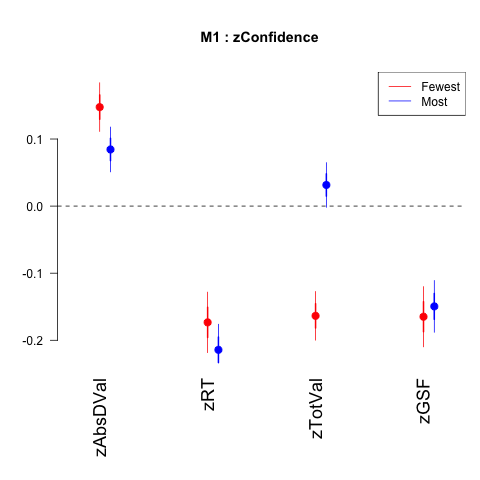

In [86]:
%%R
# Figure replicating Folke 2016. 
title_plot = ("M1 : zConfidence ")

ModelConfidenceL_1 <- glm(zConf ~ zAbsDVal + zRT  + zTotVal + zGSF , data=data_exp1_Like)
ModelConfidenceD_1 <- glm(zConf ~ zAbsDVal + zRT + zTotVal + zGSF , data=data_exp1_DisLike)

#summary(logitMod_FF2017)
#summary(logitModLike_FF2017)
#summary(logitModUnlike_FF2017)

coefplot(ModelConfidenceD_1,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("topright",  legend=c("Fewest", "Most"),col=c("red", "blue"), lty=1:1, cex=1)

ValCh: Value Chosen Item 

ValUnCh: Value Unchosen Item

[1] "Like BIC:"
[1] 9914.591
[1] "DisLike BIC:"
[1] 10572.62


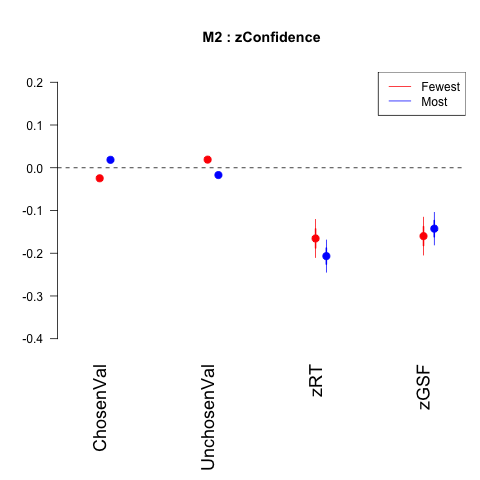

In [87]:
%%R
#title
title_plot = ("M2 : zConfidence")

ModelConfidenceL_2 <- glm(zConf ~  ChosenVal + UnchosenVal + zRT + zTotVal + zGSF, data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~  ChosenVal + UnchosenVal + zRT + zTotVal + zGSF, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-.4, .2) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Fewest", "Most"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 9922.216
[1] "DisLike BIC:"
[1] 10576.22


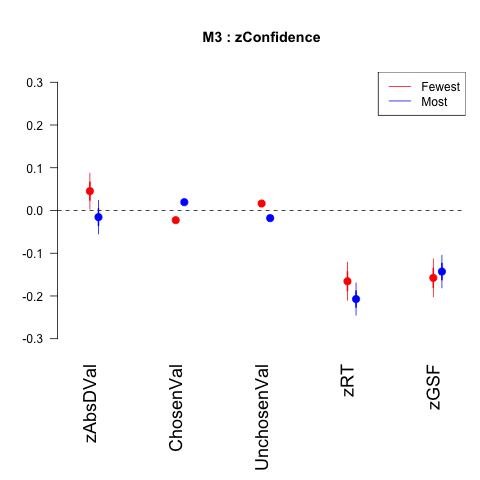

In [88]:
%%R
#title
title_plot = ("M3 : zConfidence")

ModelConfidenceL_2 <- glm(zConf ~ zAbsDVal + ChosenVal + UnchosenVal + zRT + zTotVal + zGSF, data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~ zAbsDVal +  ChosenVal + UnchosenVal + zRT + zTotVal + zGSF, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-0.3, 0.3) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Fewest", "Most"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 9930.904
[1] "DisLike BIC:"
[1] 10584.2


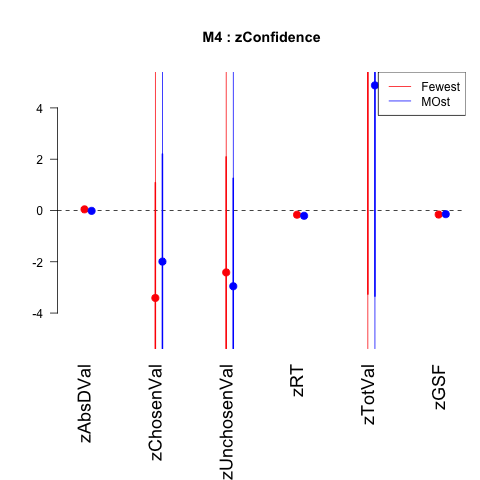

In [89]:
%%R
#title
title_plot = ("M4 : zConfidence")

ModelConfidenceL_2 <- glm(zConf ~ zAbsDVal + zChosenVal + zUnchosenVal + zRT + zTotVal + zGSF, data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~ zAbsDVal +  zChosenVal + zUnchosenVal + zRT + zTotVal + zGSF, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-5, 5) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Fewest", "MOst"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 9914.591
[1] "DisLike BIC:"
[1] 10572.62


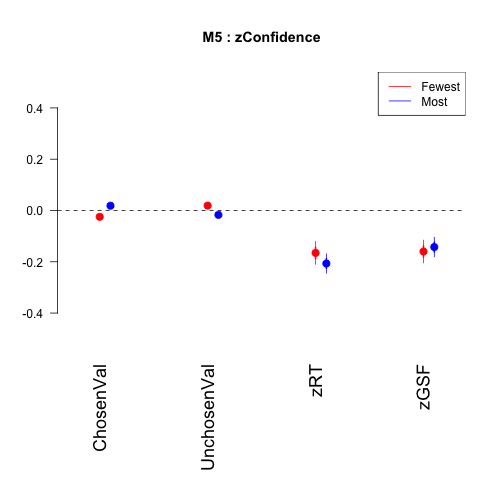

In [90]:
%%R
#title
title_plot = ("M5 : zConfidence")

ModelConfidenceL_2 <- glm(zConf ~  ChosenVal + UnchosenVal + zRT + zGSF, data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~  ChosenVal + UnchosenVal + zRT + zGSF, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-.5, .5) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Fewest", "Most"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 10391.54
[1] "DisLike BIC:"
[1] 10896.93
[1] "Most frame coefficients"
               Estimate Std. Error    t value     Pr(>|t|)
(Intercept)  -0.0188739 0.01817181  -1.038637 2.990392e-01
zChosenVal    0.6126288 0.04369507  14.020547 1.365850e-43
zUnchosenVal -0.6007465 0.04774969 -12.581159 1.339769e-35
[1] "Fewest frame coefficients"
               Estimate Std. Error   t value     Pr(>|t|)
(Intercept)  -0.2728503 0.01930372 -14.13460 2.944704e-44
zChosenVal   -0.7719492 0.05013997 -15.39588 6.051216e-52
zUnchosenVal  0.5961799 0.04588167  12.99386 8.232377e-38


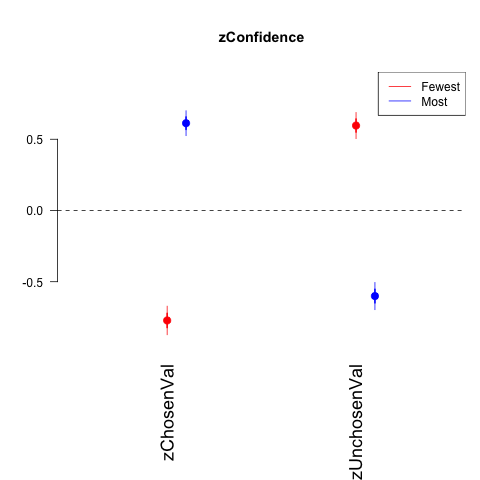

In [91]:
%%R
#title
title_plot = ("zConfidence")

ModelConfidenceL_2 <- glm(zConf ~  zChosenVal + zUnchosenVal , data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~  zChosenVal + zUnchosenVal , data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-.9, .9) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Fewest", "Most"),col=c("red", "blue"), lty=1:1, cex=1)

print ('Most frame coefficients')
print(summary(ModelConfidenceL_2)$coefficients)
print ('Fewest frame coefficients')
print(summary(ModelConfidenceD_2)$coefficients)


[1] "Like BIC:"
[1] 10512.35
[1] "DisLike BIC:"
[1] 11007.12


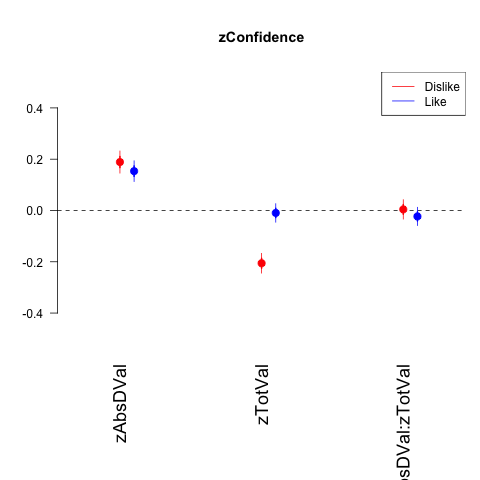

In [92]:
%%R
#title
title_plot = ("zConfidence")

ModelConfidenceL_2 <- glm(zConf ~  zAbsDVal + zTotVal +  zAbsDVal:zTotVal , data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~  zAbsDVal + zTotVal + zAbsDVal:zTotVal , data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, ylim=c(-0.5, 0.5), mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 10413.41
[1] "DisLike BIC:"
[1] 10911.56
[1] "Most frame coefficients"
                           Estimate Std. Error      t value     Pr(>|t|)
(Intercept)           -0.0001978814 0.02135801 -0.009264973 9.926082e-01
zAbsDVal               0.0279275299 0.02366591  1.180074116 2.380439e-01
zChosenVal             0.5723323903 0.06852475  8.352199909 9.250058e-17
zUnchosenVal          -0.5730839761 0.06589540 -8.696874030 4.978153e-18
zAbsDVal:zChosenVal    0.0010372693 0.04466481  0.023223414 9.814733e-01
zAbsDVal:zUnchosenVal -0.0298989927 0.05166536 -0.578704804 5.628224e-01
[1] "Fewest frame coefficients"
                         Estimate Std. Error     t value     Pr(>|t|)
(Intercept)           -0.25253285 0.02242198 -11.2627373 5.686875e-29
zAbsDVal               0.07430492 0.02473340   3.0042333 2.679728e-03
zChosenVal            -0.72592456 0.06819744 -10.6444547 4.267420e-26
zUnchosenVal           0.52615651 0.07096565   7.4142424 1.497392e-13
zAbsDVal:zChosen

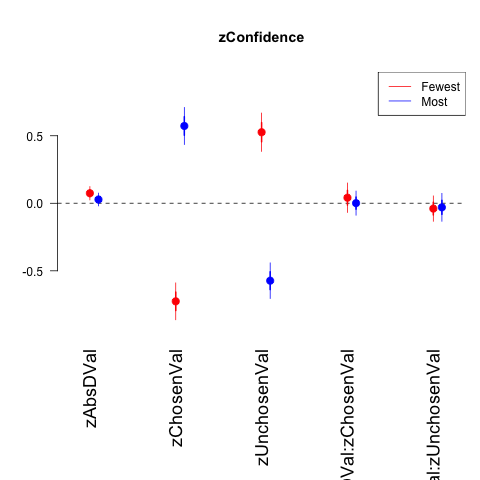

In [93]:
%%R
#title
title_plot = ("zConfidence")

ModelConfidenceL_2 <- glm(zConf ~  zAbsDVal + zChosenVal + zUnchosenVal + zAbsDVal:zChosenVal + zAbsDVal:zUnchosenVal, data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~  zAbsDVal + zChosenVal + zUnchosenVal + zAbsDVal:zChosenVal + zAbsDVal:zUnchosenVal, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-.9, .9) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Fewest", "Most"),col=c("red", "blue"), lty=1:1, cex=1)

print ('Most frame coefficients')
print(summary(ModelConfidenceL_2)$coefficients)
print ('Fewest frame coefficients')
print(summary(ModelConfidenceD_2)$coefficients)


[1] "Like BIC:"
[1] 10025.13
[1] "DisLike BIC:"
[1] 10619.14


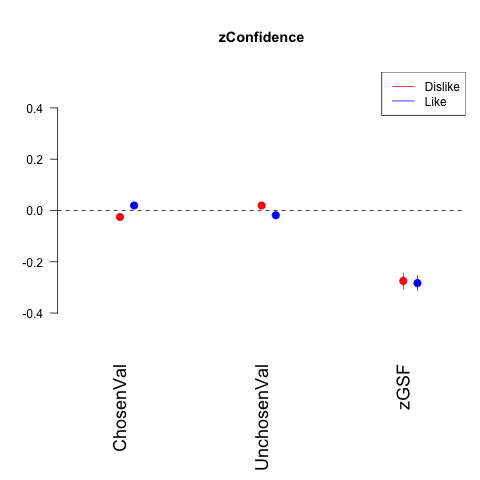

In [94]:
%%R
#title
title_plot = ("zConfidence")

ModelConfidenceL_2 <- glm(zConf ~  ChosenVal + UnchosenVal  + zGSF, data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~  ChosenVal + UnchosenVal + zGSF, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-.5, .5) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

<a id='regPart'></a>
# 3.2. Generate regression plots for condition and individual participants 
## ChoiceITM~ BehavioralParams + DDT

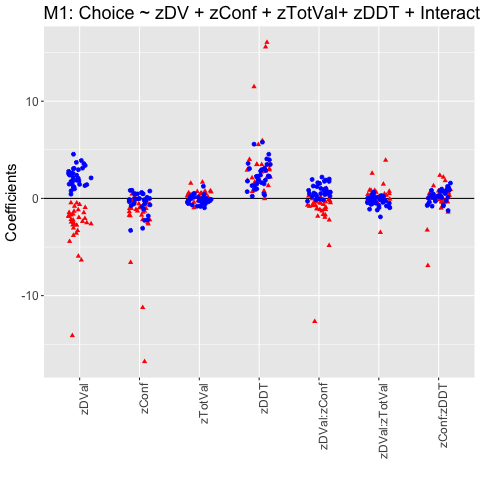

In [89]:
%%R
#Run for all the participants

#Define number of regressors to use
numCol = 7
# Extract values for LIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)

for (i in unique(data_exp1_Like[,"Part"])){
    data_rgrs_subj  <- data_exp1_Like[ which(data_exp1_Like$Part==i), ]
    rsults <- glm(Choice ~ zDVal + zConf + zTotVal + zDVal:zConf + zDVal:zTotVal + zDDT + zConf:zDDT, data=data_rgrs_subj, family=binomial(link="logit"))
    # To avoid plotting the intercept
    partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameLike <- data.frame(partCoefs)

#extract the name of the coefficients
a <- names (rsults$coefficients)

#replace names for coefficients in dataframe
for (j in 2: length(a)){
    colnames(CoefsDataFrameLike)[j-1] <- a[j]
}
CoefsDataFrameLike

#print(rsults)
#print(CoefsDataFrameLike)

# Extract values for DISLIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)
for (i in unique(data_exp1_DisLike[,"Part"])){
    data_rgrs_subj  <- data_exp1_DisLike[ which(data_exp1_DisLike$Part==i), ]
    rsults <- glm(Choice ~ zDVal + zConf + zTotVal + zDVal:zConf + zDVal:zTotVal + zDDT + zConf:zDDT, data=data_rgrs_subj, family=binomial(link="logit"))
    # To avoid plotting the intercept
    partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}
#transform coefficiencts by participant vector to dataframe
CoefsDataFrameDislike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
    colnames(CoefsDataFrameDislike)[j-1] <- a[j]
}

CoefsDataFrameDislike

jitter <- position_jitter(width = 0.2)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = melt(CoefsDataFrameDislike),aes(x=variable, y=value), shape = 17, color='red', position = jitter) +
      geom_point(data = melt(CoefsDataFrameLike), aes(x=variable, y=value),color='blue', position = jitter) + labs(x = "", y = "Coefficients") +
      ggtitle("M1: Choice ~ zDV + zConf + zTotVal+ zDDT + Interactions") + theme(legend.position="Top",text = element_text(size=15),
        axis.text.x = element_text(angle=90, hjust=1))



#save as an image
#ggsave("Output/Choice_Reg_Participant.tiff", units="in", width=6, height=4, dpi=300, compression = 'lzw')
plot2

## Confidence ~ BehavParams + GSF

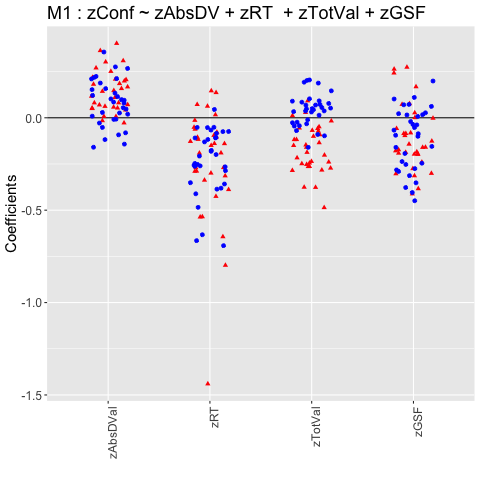

In [90]:
%%R
#Generate regression plots for individual participants 

#Run for all the participants
numCol = 4
# Extract values for LIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)
for (i in unique(data_exp1_Like[,"Part"])){
data_rgrs_subj  <- data_exp1_Like[ which(data_exp1_Like$Part==i), ]
rsults <- glm(zConf ~ zAbsDVal + zRT  + zTotVal + zGSF, data=data_rgrs_subj)
#print(summary(rsults)$coefficients )
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameLike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
colnames(CoefsDataFrameLike)[j-1] <- a[j]
}
CoefsDataFrameLike

#print(rsults)
#print(CoefsDataFrameLike)



# Extract values for DISLIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)
for (i in unique(data_exp1_DisLike[,"Part"])){
data_rgrs_subj  <- data_exp1_DisLike[ which(data_exp1_DisLike$Part==i), ]
rsults <- glm(zConf ~ zAbsDVal + zRT  + zTotVal + zGSF, data=data_rgrs_subj)
#print(summary(rsults)$coefficients )
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}
#transform coefficiencts by participant vector to dataframe
CoefsDataFrameDislike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
colnames(CoefsDataFrameDislike)[j-1] <- a[j]
}
CoefsDataFrameDislike

jitter <- position_jitter(width = 0.2)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = melt(CoefsDataFrameDislike),aes(x=variable, y=value), shape = 17, color='red', position = jitter) +
      geom_point(data = melt(CoefsDataFrameLike), aes(x=variable, y=value),color='blue', position = jitter) + labs(x = "", y = "Coefficients") +
      ggtitle("M1 : zConf ~ zAbsDV + zRT  + zTotVal + zGSF") + theme(legend.position="Top",text = element_text(size=15),
        axis.text.x = element_text(angle=90, hjust=1))
      
#ggsave("Output/Confidence_Reg_Participant.tiff", units="in", width=5, height=4, dpi=300, compression = 'lzw')

plot2


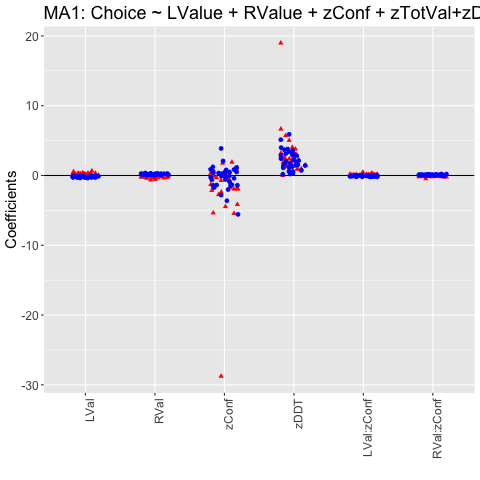

In [91]:
%%R
#Run for all the participants

#Define number of regressors to use
numCol = 6
# Extract values for LIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)

for (i in unique(data_exp1_Like[,"Part"])){
    data_rgrs_subj  <- data_exp1_Like[ which(data_exp1_Like$Part==i), ]
    rsults <- glm(Choice ~ LVal + RVal + zConf + zDDT + LVal:zConf  + RVal:zConf  , data=data_rgrs_subj, family=binomial(link="logit"))
    # To avoid plotting the intercept
    partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])   
   #print (rsults)
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameLike <- data.frame(partCoefs)

#extract the name of the coefficients
a <- names (rsults$coefficients)

#replace names for coefficients in dataframe
for (j in 2: length(a)){
    colnames(CoefsDataFrameLike)[j-1] <- a[j]
}
CoefsDataFrameLike

# Extract values for DISLIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)
for (i in unique(data_exp1_DisLike[,"Part"])){
    data_rgrs_subj  <- data_exp1_DisLike[ which(data_exp1_DisLike$Part==i), ]
    rsults <- glm(Choice ~ LVal + RVal + zConf + zDDT + LVal:zConf  + RVal:zConf, data=data_rgrs_subj, family=binomial(link="logit"))
    # To avoid plotting the intercept
    partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameDislike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)

#replace names for coefficients in dataframe
for (j in 2: length (a)){
    colnames(CoefsDataFrameDislike)[j-1] <- a[j]
}

CoefsDataFrameDislike

jitter <- position_jitter(width = 0.2)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = melt(CoefsDataFrameDislike),aes(x=variable, y=value), shape = 17, color='red', position = jitter) +
      geom_point(data = melt(CoefsDataFrameLike), aes(x=variable, y=value),color='blue', position = jitter) + labs(x = "", y = "Coefficients") +
      ggtitle("MA1: Choice ~ LValue + RValue + zConf + zTotVal+zDDT+interactions") + theme(legend.position="Top",text = element_text(size=15),
        axis.text.x = element_text(angle=90, hjust=1))

#save as an image
#ggsave("Output/Choice_Reg_Participant.tiff", units="in", width=6, height=4, dpi=300, compression = 'lzw')
plot2


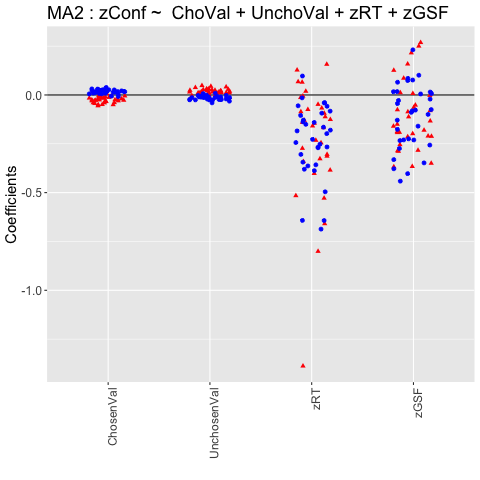

In [92]:
%%R
#Generate regression plots for individual participants 

#Run for all the participants
#Select the number of columns that correspond to actual parameter if not the matrix (and the figure) will include the values for the std errors
numCol = 4
# Extract values for LIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)
for (i in unique(data_exp1_Like[,"Part"])){
data_rgrs_subj  <- data_exp1_Like[ which(data_exp1_Like$Part==i), ]
rsults <- glm(zConf ~  ChosenVal + UnchosenVal + zRT + zGSF, data=data_rgrs_subj)
#print(summary(rsults)$coefficients )
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameLike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
colnames(CoefsDataFrameLike)[j-1] <- a[j]
}
CoefsDataFrameLike

#print(rsults)
#print(CoefsDataFrameLike)

# Extract values for DISLIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)
for (i in unique(data_exp1_DisLike[,"Part"])){
data_rgrs_subj  <- data_exp1_DisLike[ which(data_exp1_DisLike$Part==i), ]
rsults <- glm(zConf ~   ChosenVal + UnchosenVal  + zRT + zGSF, data=data_rgrs_subj)
#print(summary(rsults)$coefficients )
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}
#transform coefficiencts by participant vector to dataframe
CoefsDataFrameDislike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
colnames(CoefsDataFrameDislike)[j-1] <- a[j]
}
CoefsDataFrameDislike

jitter <- position_jitter(width = 0.2)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = melt(CoefsDataFrameDislike),aes(x=variable, y=value), shape = 17, color='red', position = jitter) +
      geom_point(data = melt(CoefsDataFrameLike), aes(x=variable, y=value),color='blue', position = jitter) + labs(x = "", y = "Coefficients") +
      ggtitle("MA2 : zConf ~  ChoVal + UnchoVal + zRT + zGSF") + theme(legend.position="Top",text = element_text(size=15),
        axis.text.x = element_text(angle=90, hjust=1))
      
#ggsave("Output/Confidence_Reg_Participant.tiff", units="in", width=5, height=4, dpi=300, compression = 'lzw')

plot2


## 3.4 Reaction time regression

[1] "Like BIC:"
[1] 11359.3
[1] "DisLike BIC:"
[1] 11040.23


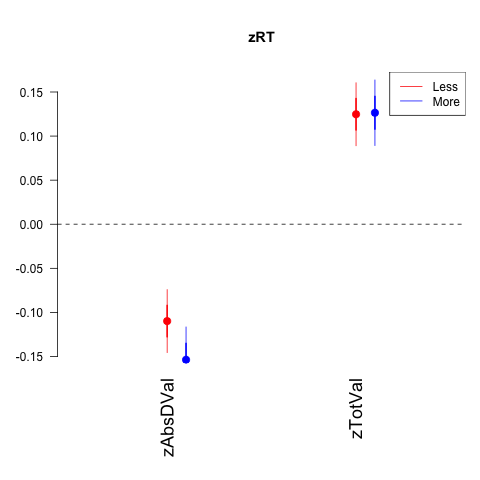

In [83]:
%%R
#regression for confidence and familiarity
title_plot = ("zRT")

ModelConfidenceL_M3 <- glm(zRT ~ zAbsDVal + zTotVal, data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zRT ~ zAbsDVal + zTotVal , data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("topright",  legend=c("Less", "More"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 10857.4
[1] "DisLike BIC:"
[1] 11339.32


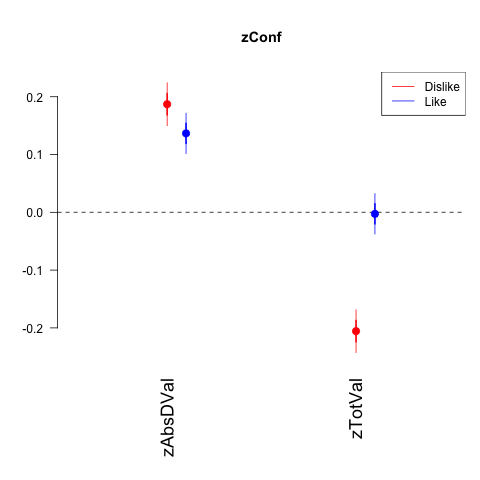

In [94]:
%%R
#regression for confidence and familiarity
title_plot = ("zConf")

ModelConfidenceL_M3 <- glm(zConf ~ zAbsDVal + zTotVal, data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zConf ~ zAbsDVal + zTotVal , data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

# Appendix
_____________________________________________________________________________________________________________________

<a id='ImpPkg'></a>
# 1. Import Packages

In [1]:
import numpy as np
import pandas as pd
from pandas.core.frame import DataFrame as DF

import seaborn as sns
sns.set(color_codes=True)
#np.random.seed(sum(map(ord, "distributions")))
from sklearn import linear_model  # packages for the logistic regression function to plot the logistic regression 
from sklearn.linear_model import LogisticRegression # packages for the logistic regression function to plot the logistic regression 
import scipy
from scipy import stats, integrate
from scipy.stats import mode
from scipy.stats.stats import pearsonr # Pearson's correlation
from copy import copy as copy
import operator as operator
import pylab

# Plotting tools
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
%pylab inline
figsize(5, 5)

import glob

import os
# Added to avoid OMP:error#15
os.environ['KMP_DUPLICATE_LIB_OK']='True'

Populating the interactive namespace from numpy and matplotlib


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['copy', 'pylab']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [2]:
import rpy2

%load_ext rpy2.ipython
# Set up interface with R
# Make it easy to set and find values in a multi-index DF
idx = pd.IndexSlice
# Set up interface with R
%config InlineBackend.figure_format = 'retina'
import warnings
from rpy2.rinterface import RRuntimeWarning
warnings.filterwarnings("ignore", category=RRuntimeWarning)


In [3]:
%%R
# Use in case the libraries are not available in the system
#install.packages('lme4')
#install.packages("car")
#install.packages("ggplot2")
#install.packages("broom")
#install.packages("arm")
#install.packages("ggplot2")
#install.packages("optimx")
#install.packages("multcomp")

NULL


<a id='LoadFunc'></a>
# 2. Defining Functions

#### Taken from Folke et al. (2016)

### Plot distributions

In [4]:
def participant_densities(data, var, xlim=(0,100), rug=True):
    # a counter that tells us where a given participant's data should be plotted
    order = 1

    # a list of all the participants in the dataset
    participants = data.loc[:, 'Part'].unique()

    # defining the figure size
    sns.set_style('white')
    fig = figure(figsize=(15,70))

    for x in participants:
        # defining the sub figures
            sub={}
            sub['%s' % x] = plt.subplot(len(participants)/2, 3, order)
            sns.kdeplot(data.loc[data['Part'] == x, var].values, ax = sub['%s' % x], shade=True)
            #if rug==True:
            #    sns.rugplot(data.loc[data['Part'] == x, var].values, ax = sub['%s' % x])
            sub['%s' % x].set_title('participant %s' % x)
            #sub['%s' % x].set_xlim(xlim)
            order += 1

### Split variable into participantwise quantiles

In [5]:
def parsplit(DF, input, quantiles):
    qvalues = pd.qcut(DF[input], quantiles, labels = range(1, quantiles+1))
    return qvalues

### Full simple logistic graph

In [6]:
def logisticplot_all (moderator, modhigh, modlow, data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
    sns.set(font_scale=1.5, style='white')
    fig = figure(figsize=(6,5))
    fig.set_facecolor('white')
    
    # defining the sigmoid function
    def model(x):
        y = 1 / (1 + np.exp(-x))
        return y
    
    sub = plt.subplot()


    #run the classifier
    clf = linear_model.LogisticRegression(C=1e5)

    # Paula used these dictionaries to store the values of the predictive lines for all the participants.
    logit_low = {}
    logit_high = {}

    # I think this defines the problem space
    X_test = np.linspace(-5,10,300)

    # fitting the predictive logistic model for the low_confidence trials, for a participant specified by x
    # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data.loc[data[(data[moderator]==0)].index, xaxis][:, np.newaxis],
            data.loc[data[(data[moderator]==0)].index, yaxis])
    logit_low = model(X_test*clf.coef_ + clf.intercept_).ravel()

    print ('Low measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)


    # fitting the predictive logistic model for the high_confidence trials, for a participant specified by x
    # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data.loc[data[(data[moderator]==1)].index, xaxis][:, np.newaxis],
            data.loc[data[(data[moderator]==1)].index, yaxis])
    logit_high = model(X_test * clf.coef_ + clf.intercept_).ravel()
    
    print ('high measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)

    
    
    #Plotting the predictive lines
    line_high = sub.plot(X_test, logit_high,'r--', color=modhighcol, linewidth=5, label=modhigh, zorder=6)
    line_low = sub.plot(X_test, logit_low,'r--', color=modlowcol, linewidth=5, label=modlow, zorder=5)


    #Plotting the binned data
    data['DVBin2'] = data.groupby(parvar).apply(parsplit, input=xaxis, quantiles=4).values
    
    # determine the x coordinates
    x_cords= data.groupby('DVBin2')[xaxis].mean()
    
    # determine low y coordinates
    y_cords_low = data.loc[(data[moderator]==0), :].groupby('DVBin2')[yaxis].mean().values
    
    # determine low y standard errors
    test = pd.DataFrame(data.loc[(data[moderator]==0), :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
    y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
    
    # determine high y coordinates
    y_cords_high = data.loc[(data[moderator]==1), :].groupby('DVBin2')[yaxis].mean().values
    
    # determine high y standard errors
    test2 = pd.DataFrame(data.loc[data[moderator]==1, :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
    y_high_error = test2.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
    # plot the low points
    plt.scatter(x_cords, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1)
    # plot low error bars
    plt.errorbar(x_cords, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)
    
    # plot the high points
    plt.scatter(x_cords, y_cords_high, c=modhighcol, marker='o', s=60, zorder=2)
    # plot high error bars
    plt.errorbar(x_cords, y_cords_high, yerr=y_high_error, fmt='o', zorder=4, c=modhighcol)
    
    
    # Set Labels
    sub.set_ylabel(ylab, fontsize=28)
    sub.set_xlabel(xlab, fontsize=28)

    # Set Ticks
    sub.set_xticks((-5,-3,-1,1,3,5))
    sub.set_yticks((0,0.25,0.5,0.75,1))
    sub.tick_params(axis='both', which='major', labelsize=20)

    # Set Limits
    sub.set_ylim(-0.01, 1.01)
    sub.set_xlim(-5, 5)

    # Set Title
    if title == 'empty':
        sub.set_title('')
    else:
        sub.set_title(title)
    
    leg = sub.legend(loc=0, prop={'size':20})
    leg.get_frame().set_linewidth(0.0)

    sns.despine()
    
    return plt

### Full simple logistic graph (no bins)

In [7]:
def logisticplot_simpl (moderator, modhigh, modlow, data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
    sns.set(font_scale=1.5, style='white')
    fig = figure(figsize=(8,7))
    fig.set_facecolor('white')
    
    # defining the sigmoid function
    def model(x):
        y = 1 / (1 + np.exp(-x))
        return y
    
    sub = plt.subplot()


    #run the classifier
    clf = linear_model.LogisticRegression(C=1e5)

    # Paula used these dictionaries to store the values of the predictive lines for all the participants.
    logit_low = {}
    logit_high = {}

    # I think this defines the problem space
    X_test = np.linspace(-5,10,300)

    # fitting the predictive logistic model for the low_confidence trials, for a participant specified by x
    # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data.loc[data[(data[moderator]==0)].index, xaxis][:, np.newaxis],
            data.loc[data[(data[moderator]==0)].index, yaxis])
    logit_low = model(X_test*clf.coef_ + clf.intercept_).ravel()
    print ('Low measure coef',clf.coef_)
    
    # fitting the predictive logistic model for the high_confidence trials, for a participant specified by x
    # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data.loc[data[(data[moderator]==1)].index, xaxis][:, np.newaxis],
            data.loc[data[(data[moderator]==1)].index, yaxis])
    logit_high = model(X_test * clf.coef_ + clf.intercept_).ravel()
    print ('High measure coef',clf.coef_)



    #Plotting the predictive lines
    line_high = sub.plot(X_test, logit_high, color=modhighcol, linewidth=5, label=modhigh, zorder=6)
    line_low = sub.plot(X_test, logit_low, color=modlowcol, linewidth=5, label=modlow, zorder=5) 
    
    # Set Labels
    sub.set_ylabel(ylab, fontsize=30)
    sub.set_xlabel(xlab, fontsize=30)

    # Set Ticks
    sub.set_xticks((-5,-3,-1,1,3,5))
    sub.set_yticks((0,0.25,0.5,0.75,1))
    sub.tick_params(axis='both', which='major', labelsize=20)

    # Set Limits
    sub.set_ylim(-0.01, 1.01)
    sub.set_xlim(-5, 5)

    # Set Title
    if title == 'empty':
        sub.set_title('')
    else:
        sub.set_title(title)
    
    sub.legend(loc=0, prop={'size':20})
    leg.get_frame().set_linewidth(0.0)

    sns.despine()

### Regression Coefficients Plot

In [8]:
def Coefpresplot(regtable, intercept=False, title='Regression Coefficients', size='big', ylimits=(), ymultiple=0.5, ticklabsize=25, n_ET_predictors = 0):

    # Import itertools so that we can iterate through the colours
    import itertools
    
    # Import locators so that we can tidy up the yaxis
    from matplotlib.ticker import MultipleLocator, FormatStrFormatter
    
    # rounding function to get edges to even 0.5 values
    def round_to(n, precision):
        correction = 0.5 if n >= 0 else -0.5
        return int( n/precision+correction ) * precision

    def round_to_5(n):
        return round_to(n, 0.5)

    # Set seaborn style for the plot
    sns.set(style='white')
    
    # Generate the figure
    if size=='big':
        fig = plt.figure(figsize=[20,8])
    elif size=='long':
        fig = plt.figure(figsize=[20,4])
    elif size=='narrow':
        fig = plt.figure(figsize=[10,4])
        
    fig.suptitle(title, fontsize=20)
    gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)
    ax = fig.add_subplot(gs[0,0])
    
    # Set axis limits based on whether to include the intercept or not    
    if intercept == True:
        XLim = (0.75, len(regtable.columns) + 0.25)
        YLim = (round_to_5(regtable.loc['CImin', :].min()-0.1), round_to_5(regtable.loc['CImax', :].max()+0.2))
    else:
        XLim = (0.75, len(regtable.columns) - 0.75)
        YLim = (round_to_5(regtable.loc['CImin', regtable.columns[1]:].min()-0.2), round_to_5(regtable.loc['CImax', regtable.columns[1]:].max()+0.2))
    if ylimits != ():
        YLim = ylimits
    ax.set_xlim(XLim)
    ax.set_ylim(YLim)
    
    # Draw a line through the 0-value on the y-axis
    line = ax.plot(XLim, [0, 0], color='black', ls='--', alpha = 0.5, lw=3)
    
    
    # If intercept is true, plot the coefficient for the intercept
    if intercept == True:
        Coefficients = regtable.columns
    else:
        Coefficients = regtable.columns[1:]
        
    # Determine the colours for the coefficients based on the n_ET_variable
    n_predictors = len(Coefficients)
    n_non_ET_predictors = n_predictors - n_ET_predictors
    
    colourlist = ['#000000'] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    
        
    # Plot all the coefficients with 95% CI
    position = 0
    for Coefficient in Coefficients:
        position += 1
        ax.plot(position, regtable.loc['coefficient', Coefficient], marker='o', ms=8, color=colourlist[position-1],)
        ax.errorbar(position, regtable.loc['coefficient', Coefficient],
                    yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color=colourlist[position-1])

    # Setting the x-axis major tick's location
    ax.set_xticks(range(1, position+1))
    
    # set the y-axis major tick position
    ax.yaxis.set_major_locator(MultipleLocator(ymultiple))


    # Setting the x-axis major tick's label
    if intercept == True:
        ax.set_xticklabels(regtable.columns, rotation=40)
    else: 
        ax.set_xticklabels(regtable.columns[1:], rotation=40)
    
    ax.tick_params(axis='both', which='major', labelsize=ticklabsize)
    ax.set_ylabel('Fixed Effects Coefficients', fontsize=18)
    
    # Autoformats the ticklabels for the xaxis
    fig.autofmt_xdate()
    
    sns.despine()

In [9]:
def Coefpresplot2(regtable,regtable2, intercept=False, title='Regression Coefficients', size='big', ylimits=(), ymultiple=0.5, ticklabsize=25, n_ET_predictors = 0):

    # Import itertools so that we can iterate through the colours
    import itertools
    
    # Import locators so that we can tidy up the yaxis
    from matplotlib.ticker import MultipleLocator, FormatStrFormatter
    
    # rounding function to get edges to even 0.5 values
    def round_to(n, precision):
        correction = 0.5 if n >= 0 else -0.5
        return int( n/precision+correction ) * precision

    def round_to_5(n):
        return round_to(n, 0.5)

    # Set seaborn style for the plot
    sns.set(style='white')
    
    # Generate the figure
    if size=='big':
        fig = plt.figure(figsize=[20,8])
    elif size=='long':
        fig = plt.figure(figsize=[20,4])
    elif size=='narrow':
        fig = plt.figure(figsize=[10,4])
        
    fig.suptitle(title, fontsize=20)
    gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)
    ax = fig.add_subplot(gs[0,0])
    

    # Set axis limits based on whether to include the intercept or not    
    
       
    
    if intercept == True:
        
        XLim = (0.75, len(regtable.columns) + 0.25)
        
        #Determine the Ymax and Ymin for both regresions results
        if round_to_5(regtable.loc['CImin', :].min()) < round_to_5(regtable2.loc['CImin', :].min()):
            Ymin = round_to_5(regtable.loc['CImin', :].min()-0.5)
        else :
            Ymin = round_to_5(regtable2.loc['CImin',:].min()-0.5)
        if round_to_5(regtable.loc['CImax', :].max()) > round_to_5(regtable2.loc['CImax', :].max()):
            Ymax = round_to_5(regtable.loc['CImax', :].max()+0.5)
        else :
            Ymax = round_to_5(regtable2.loc['CImax', :].max()+0.5)      

        YLim = (Ymin, Ymax)    
    else:
        XLim = (0.75, len(regtable.columns) - 0.75)
        
        #Determine the Ymax and Ymin for both regresions results
        if round_to_5(regtable.loc['CImin', regtable.columns[1]:].min()) < round_to_5(regtable2.loc['CImin', regtable.columns[1]:].min()):
            Ymin = round_to_5(regtable.loc['CImin', regtable.columns[1]:].min()-0.5)
        else :
            Ymin = round_to_5(regtable2.loc['CImin',regtable.columns[1]:].min()-0.5)
        if round_to_5(regtable.loc['CImax', regtable.columns[1]:].max()) > round_to_5(regtable2.loc['CImax', regtable.columns[1]:].max()):
            Ymax = round_to_5(regtable.loc['CImax', regtable.columns[1]:].max()+0.5)
        else :
            Ymax = round_to_5(regtable2.loc['CImax', regtable.columns[1]:].max()+0.5)      
        
        YLim = (Ymin, Ymax)
    
    if ylimits != ():
        YLim = ylimits
    ax.set_xlim(XLim)
    ax.set_ylim(YLim)
    
    # Draw a line through the 0-value on the y-axis
    line = ax.plot(XLim, [0, 0], color='black', ls='--', alpha = 0.5, lw=3)
    
    
    # If intercept is true, plot the coefficient for the intercept
    # both regtable should have the same regressors (and in the same order)

    if intercept == True:
        Coefficients = regtable.columns
 #       Coefficients2 = regtable2.columns
    else:
        Coefficients = regtable.columns[1:]
#        Coefficients2 = regtable2.columns[1:]
        
    # Determine the colours for the coefficients based on the n_ET_variable
    n_predictors = len(Coefficients)
    n_non_ET_predictors = n_predictors - n_ET_predictors
    
    colourlist = ['#000000'] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    
        
    # Plot all the coefficients with 95% CI
    position = 0
    for Coefficient in Coefficients:
        position += 1
        ax.plot(position-0.1, regtable.loc['coefficient', Coefficient], marker='o', ms=8, color='blue',label = 'Like')
        ax.plot(position+0.1, regtable2.loc['coefficient', Coefficient], marker='X', ms=8, color='red', label = 'Dislike')


        ax.errorbar(position-0.1, regtable.loc['coefficient', Coefficient],
                    yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color='blue')
        ax.errorbar(position+0.1, regtable2.loc['coefficient', Coefficient],
                    yerr=regtable2.loc['se', Coefficient]*1.96, lw=2, color='red')
        
        if position == 1:
            ax.legend( prop={'size': 20})

 
    # Setting the x-axis major tick's location
    ax.set_xticks(range(1, position+1))
    
    # set the y-axis major tick position
    ax.yaxis.set_major_locator(MultipleLocator(ymultiple))

    # Setting the x-axis major tick's label
    if intercept == True:
        ax.set_xticklabels(regtable.columns, rotation=40)
    else: 
        ax.set_xticklabels(regtable.columns[1:], rotation=40)
    
    ax.tick_params(axis='both', which='major', labelsize=ticklabsize)
    ax.set_ylabel('Fixed Effects Coefficients', fontsize=18)
    
    # Autoformats the ticklabels for the xaxis
    fig.autofmt_xdate()

    sns.despine()
    fig.savefig(str('SavedFigures/'+title +'.png'), dpi = 200 )

In [10]:
def Coefpresplot_bar(regtable, mixtable, intercept=False, barcol='#000000', title='Regression Coefficients', size='big', ylimits=(), ymultiple=0.5, ticklabsize=25, n_ET_predictors = 0 ):

    # Import itertools so that we can iterate through the colours
    import itertools
    
    # Import locators so that we can tidy up the yaxis
    from matplotlib.ticker import MultipleLocator, FormatStrFormatter
    
    # rounding function to get edges to even 0.5 values
    def round_to(n, precision):
        correction = 0.5 if n >= 0 else -0.5
        return int( n/precision+correction ) * precision

    def round_to_5(n):
        return round_to(n, 0.5)
            
    # Set seaborn style for the plot
    sns.set(style='white')
    
    # Generate the figure
    if size=='big':
        fig = plt.figure(figsize=[20,8])
    elif size=='long':
        fig = plt.figure(figsize=[20,4])
    elif size=='narrow':
        fig = plt.figure(figsize=[10,4])
        
    fig.suptitle(title, fontsize=20)
    gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)
    ax = fig.add_subplot(gs[0,0])
    
    # Set axis limits based on whether to include the intercept or not    
    if intercept == True:
        XLim = (0, len(regtable.columns) + 1)
        YLim = (round_to_5(np.min(mixtable)-0.2), round_to_5(np.max(mixtable)+0.2))
    else:
        XLim = (0, len(regtable.columns) )
        YLim = (round_to_5(np.min(mixtable)-0.2), round_to_5(np.max(mixtable)+0.2))
    if ylimits != ():
        YLim = ylimits
    ax.set_xlim(XLim)
    ax.set_ylim(YLim)
    
    # Draw a line through the 0-value on the y-axis
    line = ax.plot(XLim, [0, 0], color='black', ls='--', alpha = 0.5, lw=3)
    
    
    # If intercept is true, plot the coefficient for the intercept
    if intercept == True:
        Coefficients = regtable.columns
    else:
        Coefficients = regtable.columns[1:]
        
    # Determine the colours for the coefficients based on the n_ET_variable
    n_predictors = len(Coefficients)
    n_non_ET_predictors = n_predictors - n_ET_predictors
    
    colourlist = [barcol] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    
        
    # Plot all the coefficients with 95% CI
    position = 0
    for Coefficient in Coefficients:
        position += 1
        ax.bar(position, regtable.loc['coefficient', Coefficient], width=0.8,color=colourlist[position-1],)
        ax.errorbar(position, regtable.loc['coefficient', Coefficient],
                    yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color='#000000')
        
   # Plot dots for the individual coefficients
    coef_num = len(mixtable)
    for i in range(1,coef_num):
        part_coefs = mixtable[i]
        position_parts= np.full(len(part_coefs), i, dtype=int)
        jittr = np.random.uniform(low=-0.5,high=0.5,size=len(part_coefs))/2
        ax.plot(position_parts+jittr, part_coefs, marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")

        

    # Setting the x-axis major tick's location
    ax.set_xticks(range(1, position+1))
    
    # set the y-axis major tick position
    ax.yaxis.set_major_locator(MultipleLocator(ymultiple))


    # Setting the x-axis major tick's label
    if intercept == True:
        ax.set_xticklabels(regtable.columns, rotation=40)
    else: 
        ax.set_xticklabels(regtable.columns[1:], rotation=40)
    
    ax.tick_params(axis='both', which='major', labelsize=ticklabsize)
    ax.set_ylabel('Regression Coefficients', fontsize=18)
    
    # Autoformats the ticklabels for the xaxis
    fig.autofmt_xdate()
    
    sns.despine()

In [11]:
def Coefpresplot_bar2(regtable1, mixtable1,regtable2, mixtable2, intercept=False, barcol1='#000000',barcol2='#000000', title='Regression Coefficients', size='big', ylimits=(), ymultiple=0.5, ticklabsize=25, n_ET_predictors = 0 ):

    # Import itertools so that we can iterate through the colours
    import itertools
    
    # Import locators so that we can tidy up the yaxis
    from matplotlib.ticker import MultipleLocator, FormatStrFormatter
    
    # rounding function to get edges to even 0.5 values
    def round_to(n, precision):
        correction = 0.5 if n >= 0 else -0.5
        return int( n/precision+correction ) * precision

    def round_to_5(n):
        return round_to(n, 0.5)
            
    # Set seaborn style for the plot
    sns.set(style='white')
    
    # Generate the figure
    if size=='big':
        fig = plt.figure(figsize=[20,8])
    elif size=='long':
        fig = plt.figure(figsize=[20,4])
    elif size=='narrow':
        fig = plt.figure(figsize=[10,4])
        
    fig.suptitle(title, fontsize=20)
    gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)
    ax = fig.add_subplot(gs[0,0])
    
    # Set axis limits based on whether to include the intercept or not   
    # Assumuing that regtable1 and regtable2 have exactly the same number of coefficients
    if intercept == True:
        XLim = (0, len(regtable1.columns) + 2)
        YLim = (round_to_5(np.min([mixtable1,mixtable2]))-0.2, round_to_5(np.max([mixtable1,mixtable2]))+0.2)
    else:
        XLim = (0, len(regtable1.columns) +1)
        YLim = (round_to_5(np.min([mixtable1,mixtable2]))-0.2, round_to_5(np.max([mixtable1,mixtable2]))+0.2)
    if ylimits != ():
        YLim = ylimits
    ax.set_xlim(XLim)
    ax.set_ylim(YLim)
    
    # Draw a line through the 0-value on the y-axis
    line = ax.plot(XLim, [0, 0], color='black', ls='--', alpha = 0.5, lw=3)
    
    
    # If intercept is true, plot the coefficient for the intercept
    # Assumuing that regtable1 and regtable2 have exactly the same number of coefficients

    if intercept == True:
        Coefficients = regtable1.columns
    else:
        if len(regtable1.columns)<len(mixtable1):
            Coefficients = regtable1.columns
        else:
            Coefficients = regtable1.columns[1:]
        
    # Determine the colours for the coefficients based on the n_ET_variable
    n_predictors = len(Coefficients)
    n_non_ET_predictors = n_predictors - n_ET_predictors
    
    # Color for conditions 1 and 2
    colourlist1 = [barcol1] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    colourlist2 = [barcol2] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    
        
    # Plot all the coefficients with 95% CI
    position = 0
    for Coefficient in Coefficients:
        position += 1
        # Plot condition 1
        ax.bar(position-0.2, regtable1.loc['coefficient', Coefficient], width=0.4,color=colourlist1[position-1],)
        ax.errorbar(position-0.2, regtable1.loc['coefficient', Coefficient],
                    yerr=regtable1.loc['se', Coefficient]*1.96, lw=2, color='#000000')

        # Plot condition 2
        ax.bar(position+0.2, regtable2.loc['coefficient', Coefficient], width=0.4,color=colourlist2[position-1],)
        ax.errorbar(position+0.2, regtable2.loc['coefficient', Coefficient],
                    yerr=regtable2.loc['se', Coefficient]*1.96, lw=2, color='#000000')

        
   # Plot dots for the individual coefficients
    # Assumuing that mixtable1 and mixtable2 have exactly the same number of elements 
    
    if intercept == True:
        coef_num = range(0,len(mixtable1)) 
    else:
        coef_num = range(1,len(mixtable1))
        
    for i in coef_num:
        # Plot dots condition 1
        part_coefs = mixtable1[i]
        position_parts= np.full(len(part_coefs), i, dtype=int)
        jittr = np.random.uniform(low=-0.2,high=0.2,size=len(part_coefs))/2
        ax.plot(position_parts-0.2+jittr, part_coefs, marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")

        # Plot dots condition 1
        part_coefs = mixtable2[i]
        position_parts= np.full(len(part_coefs), i, dtype=int)
        jittr = np.random.uniform(low=-0.2,high=0.2,size=len(part_coefs))/2
        ax.plot(position_parts+0.2+jittr, part_coefs, marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        

    # Setting the x-axis major tick's location
    ax.set_xticks(range(1, position+1))
    
    # set the y-axis major tick position
    ax.yaxis.set_major_locator(MultipleLocator(ymultiple))


    # Setting the x-axis major tick's label
    if intercept == True:
        ax.set_xticklabels(regtable1.columns, rotation=0)        
    else:
        if len(regtable1.columns)<len(mixtable1):
            ax.set_xticklabels(regtable1.columns, rotation=0)
        else:    
            ax.set_xticklabels(regtable1.columns[1:], rotation=0)
    
    ax.tick_params(axis='both', which='major', labelsize=ticklabsize)
    ax.set_ylabel('Regression Coefficients', fontsize=18)
    
    # Autoformats the ticklabels for the xaxis
    fig.autofmt_xdate()
    
    sns.despine()

In [12]:
def regtable(fix, fix_se, names):
    fixed_betas = DF(np.array(fix)); fixed_betas = fixed_betas.transpose(); fixed_betas.columns = names
    fixed_betas.loc[1] = np.array(fix_se)
    fixed_betas.loc[2] = fixed_betas.loc[0] - (fixed_betas.loc[1]*1.96)
    fixed_betas.loc[3] = fixed_betas.loc[0] + (fixed_betas.loc[1]*1.96)
    fixed_betas.index = ['coefficient', 'se', 'CImin', 'CImax']
    return fixed_betas

In [13]:
def correl_plot2 (data_all,data_all2,x_variable,y_variable,color1 = '#000000',color2 = '#000000',x_varlabel = "x_variable" ,y_varlabel = "y_variable", data_label =('Correct', 'Error'), title = "Pretty PLot"):

    f = plt.figure(figsize=(5, 8))
    sns.set(style='white', font_scale=1.8)
    ax = sns.regplot(data=data_all, x= x_variable, y=y_variable, fit_reg=False, ci=0, color= color1, scatter_kws={'s':70,'alpha':0.3},)
    ax = sns.regplot(data=data_all2, x= x_variable, y=y_variable, fit_reg=False, ci=0, color= color2, scatter_kws={'s':70,'alpha':0.3})
    ax.set(ylabel=y_varlabel, xlabel=x_varlabel)

    # For data 1
    x=data_all[x_variable]
    y=data_all[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    p1 = ax.plot(future, future_fit, color=color1, lw=3, label = data_label[0])
    
    results = pearsonr(data_all[x_variable], data_all[y_variable])
    print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))
    
    # For data 2
    x=data_all2[x_variable]
    y=data_all2[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    p2 = ax.plot(future, future_fit, color=color2, lw=3,label = data_label[1] )
    sns.despine()
    #ax.set_title(title)    
    results = pearsonr(data_all2[x_variable], data_all2[y_variable])
    print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))
    
    ax.legend()
    ax.set_title(title)

    #plt.legend((p1, p2), data_label )
    
    plt.show()

In [14]:
def logisticplot_all_sbj_slope(moderator, modhigh, modlow, data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
#inputs example   
#logisticplot_all('DDTSplit', 'High DDT', 'Low DDT', data=data_expL, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Value (DVal)',
#                 modhighcol='#4F6A9A', modlowcol='#B5C8E9', title='empty', parvar='Part')


    # Counter to know where to plot the particpant
    order = 1
    # Initialize the array to store coefs
    coefs_all = []

   # a list of all the participants in the dataset
    participants = data.loc[:, 'Part'].unique()

    # defining the figure size
    sns.set_style('white')
    fig = figure(figsize=(50,70))

    for x in participants:
        # defining the sub figures
            sub={}
            sub['%s' % x] = plt.subplot(int(len(participants)/5+1), 5, order)
            
            
            # Extract dataframe for that particualt participant
            data_in = data.loc[data['Part'] == x]
           
            sns.set(font_scale=1.5, style='white')
           
            # defining the sigmoid function
            def model(x):
                y = 1 / (1 + np.exp(-x))
                return y

            #sub = plt.subplot()
            sub['%s' % x].set_title('Part. %s' % x, fontsize = 50 )


            #run the classifier
            clf = linear_model.LogisticRegression(C=1e5)

            # Paula used these dictionaries to store the values of the predictive lines for all the participants.
            logit_low = {}
            logit_high = {}
            logit_all = {}

            
            # I think this defines the problem space
            X_test = np.linspace(-5,10,300)

            # fitting the predictive logistic model for the low_confidence trials, for a participant specified by x
            # first I specify the value difference right - left, then I specify the choices, left or right
            clf.fit(data_in.loc[data_in[(data[moderator]==0)].index, xaxis][:, np.newaxis],
                    data_in.loc[data_in[(data[moderator]==0)].index, yaxis])
            logit_low = model(X_test*clf.coef_ + clf.intercept_).ravel()

            #print ('Part: ',x , ' Low measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)

            low_coef = clf.coef_
            low_intercept = clf.intercept_
            
            # fitting the predictive logistic model for the high_confidence trials, for a participant specified by x
            # first I specify the value difference right - left, then I specify the choices, left or right
            clf.fit(data_in.loc[data_in[(data_in[moderator]==1)].index, xaxis][:, np.newaxis],
                    data_in.loc[data_in[(data_in[moderator]==1)].index, yaxis])
            logit_high = model(X_test * clf.coef_ + clf.intercept_).ravel()

            #print ('Part: ',x ,' High measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)
            
            high_coef = clf.coef_
            high_intercept = clf.intercept_
            
            
            # fitting the predictive logistic model for all the trials, for a participant specified by x
            # first I specify the value difference right - left, then I specify the choices, left or right
            clf.fit(data_in[xaxis][:, np.newaxis],
                    data_in[yaxis])
            logit_all = model(X_test * clf.coef_ + clf.intercept_).ravel()

            #print ('Part: ',x ,' High measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)
            
            all_coef = clf.coef_
            all_intercept = clf.intercept_
    
            #Plotting the predictive lines
            line_high = sub['%s' % x].plot(X_test, logit_high, color=modhighcol, linewidth=5, label=modhigh, zorder=6,linestyle='--')
            line_low = sub['%s' % x].plot(X_test, logit_low, color=modlowcol, linewidth=5, label=modlow, zorder=5,linestyle='--')
            line_all = sub['%s' % x].plot(X_test, logit_all, color="#000000", linewidth=3, label=modlow, zorder=5,linestyle='--')
            
            coefs_part= np.column_stack((x,low_coef,low_intercept,high_coef,high_intercept,all_coef,all_intercept))
            coefs_all.append(coefs_part[0])

            
            #Plotting the binned data
            data_in['DVBin2'] = data_in.groupby(parvar).apply(parsplit, input=xaxis, quantiles=4).values[0]

            # determine the x coordinates
            x_cords= data.groupby('DVBin2')[xaxis].mean()

            # determine low y coordinates
            y_cords_low = data_in.loc[(data_in[moderator]==0), :].groupby('DVBin2')[yaxis].mean().values

            # determine low y standard errors
            test = pd.DataFrame(data_in.loc[(data_in[moderator]==0), :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
            y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))

    
            # determine high y coordinates
            y_cords_high = data_in.loc[(data_in[moderator]==1), :].groupby('DVBin2')[yaxis].mean().values

            # determine high y standard errors
            test2 = pd.DataFrame(data_in.loc[data_in[moderator]==1, :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
            y_high_error = test2.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))

            # plot the low points
            plt.scatter(x_cords, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1)
            # plot low error bars
            plt.errorbar(x_cords, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)

            # plot the high points
            plt.scatter(x_cords, y_cords_high, c=modhighcol, marker='o', s=60, zorder=2)
            # plot high error bars
            plt.errorbar(x_cords, y_cords_high, yerr=y_high_error, fmt='o', zorder=4, c=modhighcol)

    
            # Set Labels
           # sub['%s' % x].set_ylabel(ylab, fontsize=30)
           # sub['%s' % x].set_xlabel(xlab, fontsize=30)

            # Set Ticks
            sub['%s' % x].set_xticks((-5,-3,-1,1,3,5))
            sub['%s' % x].set_yticks((0,0.25,0.5,0.75,1))
            sub['%s' % x].tick_params(axis='both', which='major', labelsize=30)

            # Set Limits
            sub['%s' % x].set_ylim(-0.01, 1.01)
            sub['%s' % x].set_xlim(-5, 5)
        

            sns.despine()
            
            order += 1
    
    custom_lines = [Line2D([0], [0], color=modhighcol, lw=4),
                Line2D([0], [0], color=modlowcol, lw=4)]
    fig.legend(custom_lines, [modhigh, modlow],loc = 4,fontsize=50)       

    fig.text(0.5, -0.01, xlab, ha='center',fontsize = 70)
    fig.text(-0.01, 0.5, ylab, va='center', rotation='vertical',fontsize = 70)
    
    coefs_all = pd.DataFrame(coefs_all,columns=['Participant','Low Coef','Low Intercept','High Coef','High Intercept','All Coef','All Intercept'])
    return coefs_all

In [15]:
def z_score1(data_all, part_def,z_score_var):
    z_matrix=[]
    z_matrix_aux=[]

    for i in (data_all[part_def].unique()):
        Choicedata = data_all.loc[data_all[part_def] == i]    
    
        pX_A= pd.to_numeric(Choicedata[z_score_var]) 
        pX_zA= (pX_A - np.mean(pX_A))/np.std(pX_A)

        z_matrix_aux= pX_zA.values
    
        for  j in range(len(z_matrix_aux)):    
            z_matrix.append(z_matrix_aux[j])
    return z_matrix

In [16]:
def splitBy(data_exp1, Splits_headers = ['ConfSplit', 'GSFMedSplit','DDTMedSplit'],Splits_variables = ['Conf', 'tGSF','tDDT']):
    
    median_matrix=[]
    median_matrix_aux=[]
    median_matrix_aux_cond=[]
    Split_cols = []
    
    for h in range(len(Splits_variables)):
        median_matrix=[]
        for i in unique(data_exp1["Part"]):
            median_matrix_aux=[]
    
            for j in unique(data_exp1["BlockCond"]):
                #median_matrix_aux_cond=[]
    
                #Extract data by participant and BlockCond (1: Like, 2: Dislike)
                Splitdata = data_exp1.loc[data_exp1['Part'] == i]
                Splitdata = Splitdata.loc[Splitdata['BlockCond'] == j]
                
                # Select the column to split
                Splitdata = Splitdata.loc[:,['TrialN',Splits_variables[h]]]
                SplitSort = Splitdata.values
                # Sort for confidence column
                SplitSort = SplitSort[np.argsort(SplitSort[:, 1])]
                #print(SplitSort)
                lenPart = len(Splitdata)
                #print(lenPart)
                # Generate column with median order
                median_low = [0] * int (lenPart/2)
    
                if len(SplitSort) != 2*len(median_low):
                    median_high=  [1] * int(len(SplitSort)-len(median_low))
                else: median_high = [1] * int (lenPart/2)
            
                median_split_order = median_low + median_high
                #Attach split median order column (1 and 0)
                median_aux= np.column_stack((SplitSort,median_split_order))
                #Sort back to trial number
                SplitSorted = median_aux[np.argsort(median_aux[:, 0])]
                #print(len(SplitSorted))
                
                for kk in range(len(SplitSorted)): 
                    if len(median_matrix_aux) == 0 :
                        median_matrix_aux = SplitSorted[0]
                    else:
                        median_matrix_aux = np.vstack([median_matrix_aux, SplitSorted[kk]])
            
            
            #print(["participant "+ str(i)+ " done"])
            # sort after adding both conditions    
            median_matrix_aux = median_matrix_aux[np.argsort(median_matrix_aux[:, 0])]
            
            #Extract only the column with the median split information
            median_matrix_aux = median_matrix_aux[:,2]
            
            #append to median matrix for the participants
            for k in range(len(median_matrix_aux)):    
                median_matrix.append(median_matrix_aux [k])
        
        median_matrix = pd.DataFrame(median_matrix,columns=[Splits_headers[h]])
        #print(len (median_matrix))
        #add new column (new split variable columns) to the split matrix
        if  h == 0:
            Split_cols = median_matrix
        else:
            Split_cols = pd.concat([Split_cols,median_matrix ],axis =1)   
    
    return Split_cols

In [17]:
# Add asterisk
def add_star(RT_like, RT_dislike):
    x1, x2 = 0, 1   
    y_max = max([np.max(RT_like), np.max(RT_dislike)])
    y, h, col = y_max + y_max/50, y_max/50, 'k'
    plt.plot( [x1+0.25, x2-0.25], [ y+h, y+h], lw=1.5, c=col)
    plt.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col)
    
    
# Add asterisk
def add_star1(RT_like, RT_dislike, p):
    
    if p<0.001:
        star_text = '***'
    elif p<0.01:
        star_text = '**'
    elif p<0.05:
        star_text = '*'
        
    x1, x2 = 1, 2   
    y_max = max([np.max(RT_like), np.max(RT_dislike)])
    y, h, col = y_max + y_max/50, y_max/50, 'k'
    plt.plot( [x1+0.25, x2-0.25], [ y+h, y+h], lw=1.5, c=col)
    plt.text((x1+x2)*.5, y+h, star_text, ha='center', va='bottom', color=col)

In [18]:
def adjacent_values(vals, q1, q3):
    upper_adjacent_value = q3 + (q3 - q1) * 1.5
    upper_adjacent_value = np.clip(upper_adjacent_value, q3, vals[-1])

    lower_adjacent_value = q1 - (q3 - q1) * 1.5
    lower_adjacent_value = np.clip(lower_adjacent_value, vals[0], q1)
    return lower_adjacent_value, upper_adjacent_value



def add_violin(all_arr):
    parts = plt.violinplot( all_arr, showmeans=False, showextrema=False, showmedians=False)
    for i, face in enumerate(parts['bodies']):
        face.set_hatch('//')
        face.set_facecolor(colr_dict[i])
        face.set_edgecolor('white')
        face.set_alpha(1)
  #  parts2 = plt.violinplot( all_arr
   #                         , showmeans=False, showextrema=False, showmedians=False)
  #  for i, face in enumerate(parts2['bodies']):
       # face.set_hatch('//')
       # face.set_facecolor('None')
   #     face.set_alpha(1)

    quartile1, medians, quartile3 = np.percentile(all_arr, [25, 50, 75], axis=1)
    whiskers = np.array([
        adjacent_values(sorted_array, q1, q3) 
        for sorted_array, q1, q3 in zip(all_arr, quartile1, quartile3)])
    whiskersMin, whiskersMax = whiskers[:, 0], whiskers[:, 1]

    inds = np.arange(1, len(medians)+1)
    plt.vlines(inds, quartile1, quartile3, color='k', linestyle='-', lw=3,alpha = 0.7)
    plt.vlines(inds, whiskersMin, whiskersMax, color='k', linestyle='-', lw=1,alpha = 0.7)
    plt.scatter(inds, medians, marker='o', color='white', s=2, zorder=2,alpha = 1)    